In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from emukit.core import ParameterSpace, ContinuousParameter, DiscreteParameter
from emukit.core.initial_designs.latin_design import LatinDesign
from emukit.core.initial_designs.random_design import RandomDesign
from chimera import Chimera
from emukit.core.loop.user_function import UserFunctionWrapper
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold, cross_val_score, cross_val_predict
import plotly.express as px
import plotly.graph_objects as go
from numpy.linalg import norm
import os
import scipy.stats
import math

In [2]:
MACl_min, MACl_max, MACl_step = [0, 30, 5] ## Unit: %, 7 steps
MACl_var = np.arange(MACl_min, MACl_max+MACl_step*0.1, MACl_step)
MACl_num = len(MACl_var)

DMF_min, DMF_max, DMF_step = [0, 90, 5] ## Unit: %, 19 steps
DMF_var = np.arange(DMF_min, DMF_max+DMF_step*0.1, DMF_step)
DMF_num = len(DMF_var)

V_min, V_max, V_step = [15, 30, 0.5] ## Unit: KV, 31 steps
V_var = np.arange(V_min, V_max+V_step*0.1, V_step)
V_num = len(V_var)

Q_min, Q_max, Q_step = [0.7, 1.7, 0.05] ## Unit: μL/min, # 21 steps
Q_var = np.arange(Q_min, Q_max+Q_step*0.1, Q_step)
Q_num = len(Q_var)

T_min, T_max, T_step = [100, 150, 5] ## Unit: ℃, # 11 steps
T_var = np.arange(T_min, T_max+T_step*0.1, T_step)
T_num = len(T_var)

t_min, t_max, t_step = [10, 30, 5] ## Unit: min, # 5 steps
t_var = np.arange(t_min, t_max+t_step*0.1, t_step)
t_num = len(t_var)


var_array = [MACl_var, DMF_var, 
             V_var, Q_var,
            T_var,t_var]

x_labels = ['MACl [%]', 
            'DMF [%]', 
            'V [KV]', 
            'Q [uL/min]',
            'T [degC]',
            't [min]']    

In [3]:
def x_normalizer(X, var_array = var_array):
    
    def max_min_scaler(x, x_max, x_min):
        return (x-x_min)/(x_max-x_min)
    x_norm = []
    for x in (X):
           x_norm.append([max_min_scaler(x[i], 
                         max(var_array[i]), 
                         min(var_array[i])) for i in range(len(x))])
            
    return np.array(x_norm)

def x_denormalizer(x_norm, var_array = var_array):
    
    def max_min_rescaler(x, x_max, x_min):
        return x*(x_max-x_min)+x_min
    x_original = []
    for x in (x_norm):
           x_original.append([max_min_rescaler(x[i], 
                              max(var_array[i]), 
                              min(var_array[i])) for i in range(len(x))])

    return np.array(x_original)

def get_closest_value(given_value, array_list):
    absolute_difference_function = lambda list_value : abs(list_value - given_value)
    closest_value = min(array_list, key=absolute_difference_function)
    return closest_value
    
def get_closest_array(suggested_x, var_list):
    modified_array = []
    for x in suggested_x:
        modified_array.append([get_closest_value(x[i], var_list[i]) for i in range(len(x))])
    return np.array(modified_array)

In [4]:
X_all_grid = []
for MACl in MACl_var:
    for DMF in DMF_var:
        for V in V_var:
            for Q in Q_var:
                for T in T_var:
                    for t in t_var:
                        X_all_grid.append([MACl, DMF, V, Q, T,t])
X_all_grid = np.array(X_all_grid)
X_all_grid.shape

(4762065, 6)

In [5]:
x_eva=x_normalizer(X_all_grid)

In [6]:
### Add/minus a half step to make sure the edge conditions have the same chance in nearest neighbors
parameter_space = ParameterSpace([ContinuousParameter('x1', 0-1/(MACl_num-1)/2, 1+1/(MACl_num-1)/2),
                                  ContinuousParameter('x2', 0-1/(DMF_num-1)/2,  1+1/(DMF_num-1)/2),
                                  ContinuousParameter('x3', 0-1/(V_num-1)/2,    1+1/(V_num-1)/2),
                                  ContinuousParameter('x4', 0-1/(Q_num-1)/2,    1+1/(Q_num-1)/2),
                                  ContinuousParameter('x5', 0-1/(T_num-1)/2,    1+1/(T_num-1)/2),
                                  ContinuousParameter('x6', 0-1/(t_num-1)/2,    1+1/(t_num-1)/2)])

In [3]:
df_xrd = pd.read_csv('./data_2nd_cons.csv')
df_xrd

,ML Condition,MACl [%],DMF [%],V [KV],Q [uL/min],T [degC],t [min],XRD,Success or Fail
0,0,5,70,28.5,1.15,105,10,1.85,1
1,1,5,20,19.5,1.25,130,25,0.95,1
2,2,15,5,29.5,1.05,140,15,0.16,1
3,3,20,0,24.5,0.90,150,20,0.28,1
4,4,10,25,23.5,0.80,125,25,1.06,1
5,5,10,85,20.5,1.40,115,20,NaN,0
6,6,0,60,16.5,1.00,110,15,NaN,0
7,7,25,30,27.5,1.35,120,25,0.23,1
8,8,15,75,18.5,0.85,105,10,NaN,0
9,9,20,15,22.5,1.50,100,15,0.48,1


In [8]:
success_conditions = df_xrd[df_xrd['Success or Fail']==1]['ML Condition'].values
df_cons = df_xrd[df_xrd['ML Condition'].isin(success_conditions)]
df_cons

,ML Condition,MACl [%],DMF [%],V [KV],Q [uL/min],T [degC],t [min],XRD,Success or Fail
0,0,5,70,28.5,1.15,105,10,1.85,1
1,1,5,20,19.5,1.25,130,25,0.95,1
2,2,15,5,29.5,1.05,140,15,0.16,1
3,3,20,0,24.5,0.90,150,20,0.28,1
4,4,10,25,23.5,0.80,125,25,1.06,1
7,7,25,30,27.5,1.35,120,25,0.23,1
9,9,20,15,22.5,1.50,100,15,0.48,1
10,10,0,90,25.5,1.70,120,10,0.18,1
11,11,15,50,26.5,0.70,135,20,0.16,1
12,12,0,30,27.5,1.70,115,15,0.00,1


In [4]:
df_exp = pd.read_csv('./data_2nd_obj.csv')
df_exp

,ML Condition,MACl [%],DMF [%],V [KV],Q [uL/min],T [degC],t [min],PL_std,TRPL,Success or Fail
0,0,5,70,28.5,1.15,105,10,6.09,14.74,1
1,1,5,20,19.5,1.25,130,25,NaN,NaN,0
2,2,15,5,29.5,1.05,140,15,NaN,NaN,0
3,3,20,0,24.5,0.90,150,20,NaN,NaN,0
4,4,10,25,23.5,0.80,125,25,2.52,63.93,1
5,5,10,85,20.5,1.40,115,20,NaN,NaN,0
6,6,0,60,16.5,1.00,110,15,NaN,NaN,0
7,7,25,30,27.5,1.35,120,25,1.74,71.79,1
8,8,15,75,18.5,0.85,105,10,NaN,NaN,0
9,9,20,15,22.5,1.50,100,15,NaN,NaN,0


In [10]:
success_conditions = df_exp[df_exp['Success or Fail']==1]['ML Condition'].values
df_obj = df_exp[df_exp['ML Condition'].isin(success_conditions)]
df_obj

,ML Condition,MACl [%],DMF [%],V [KV],Q [uL/min],T [degC],t [min],PL_std,TRPL,Success or Fail
0,0,5,70,28.5,1.15,105,10,6.09,14.74,1
4,4,10,25,23.5,0.80,125,25,2.52,63.93,1
7,7,25,30,27.5,1.35,120,25,1.74,71.79,1
10,10,0,90,25.5,1.70,120,10,1.83,89.50,1
12,12,0,30,27.5,1.70,115,15,5.09,73.76,1
13,13,0,35,21.5,1.60,115,15,3.86,42.86,1
14,14,15,0,21.0,0.80,140,15,2.18,34.81,1
15,15,15,10,19.0,0.95,145,15,1.05,124.35,1
16,16,15,10,23.5,1.40,145,15,2.40,231.71,1
17,17,15,15,27.0,1.50,145,15,2.46,144.13,1


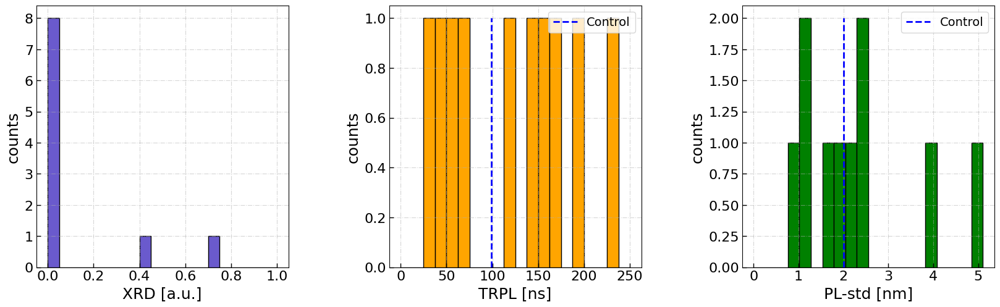

In [11]:
fig,axes = plt.subplots(1, 3, figsize=(20, 5.5), sharey = False)
fs = 20
axes[0].hist(df_cons.iloc[:,-2][-10:], bins = 20,edgecolor='black',facecolor='slateblue',range =(0,1))
axes[0].set_xlabel('XRD [a.u.]', fontsize = 18)    
axes[0].set_ylabel('counts', fontsize = 18)
# axes[0].legend(fontsize = fs*0.7)

axes[1].hist(df_obj.iloc[:,-2][-10:], bins = 20,edgecolor='black',facecolor='orange',range =(0,250))
axes[1].vlines([99],0,1., linestyles="--", colors='blue',linewidth=2,label = 'Control')
axes[1].set_xlabel('TRPL [ns]', fontsize = 18)    
axes[1].set_ylabel('counts', fontsize = 18)
axes[1].legend(fontsize = fs*0.7)

axes[2].hist(df_obj.iloc[:,-3][-10:], bins = 20,edgecolor='black',facecolor='green',range =(0,5.1))
axes[2].vlines([2],0,2., linestyles="--", colors='blue',linewidth=2,label = 'Control')
axes[2].set_xlabel('PL-std [nm]', fontsize = 18)    
axes[2].set_ylabel('counts', fontsize = 18)
axes[2].legend(fontsize = fs*0.7)

for ax in axes:
    ax.tick_params(direction='in', length=5, width=1, labelsize = fs*.8, grid_alpha = 0.5)
    ax.grid(True, linestyle='-.')
plt.subplots_adjust(wspace = 0.4)

plt.show()

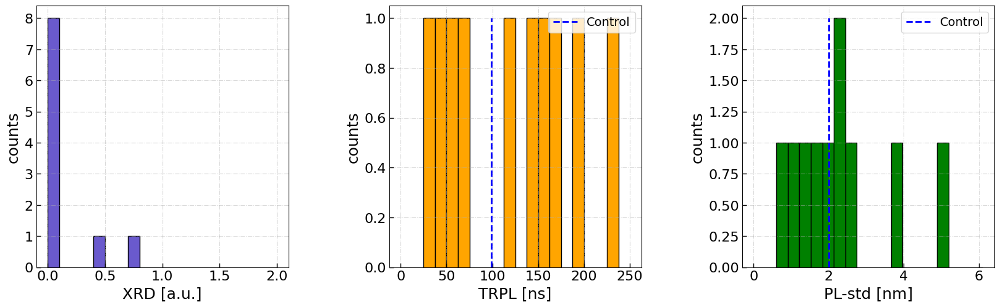

In [12]:
fig,axes = plt.subplots(1, 3, figsize=(20, 5.5), sharey = False)
fs = 20
axes[0].hist(df_cons.iloc[:,-2][-10:], bins = 20,edgecolor='black',facecolor='slateblue',range =(0,2))
axes[0].set_xlabel('XRD [a.u.]', fontsize = 18)    
axes[0].set_ylabel('counts', fontsize = 18)
# axes[0].legend(fontsize = fs*0.7)

axes[1].hist(df_obj.iloc[:,-2][-10:], bins = 20,edgecolor='black',facecolor='orange',range =(0,250))
axes[1].vlines([99],0,1., linestyles="--", colors='blue',linewidth=2,label = 'Control')
axes[1].set_xlabel('TRPL [ns]', fontsize = 18)    
axes[1].set_ylabel('counts', fontsize = 18)
axes[1].legend(fontsize = fs*0.7)

axes[2].hist(df_obj.iloc[:,-3][-10:], bins = 20,edgecolor='black',facecolor='green',range =(0,6.1))
axes[2].vlines([2],0,2., linestyles="--", colors='blue',linewidth=2,label = 'Control')
axes[2].set_xlabel('PL-std [nm]', fontsize = 18)    
axes[2].set_ylabel('counts', fontsize = 18)
axes[2].legend(fontsize = fs*0.7)

for ax in axes:
    ax.tick_params(direction='in', length=5, width=1, labelsize = fs*.8, grid_alpha = 0.5)
    ax.grid(True, linestyle='-.')
plt.subplots_adjust(wspace = 0.4)

plt.show()

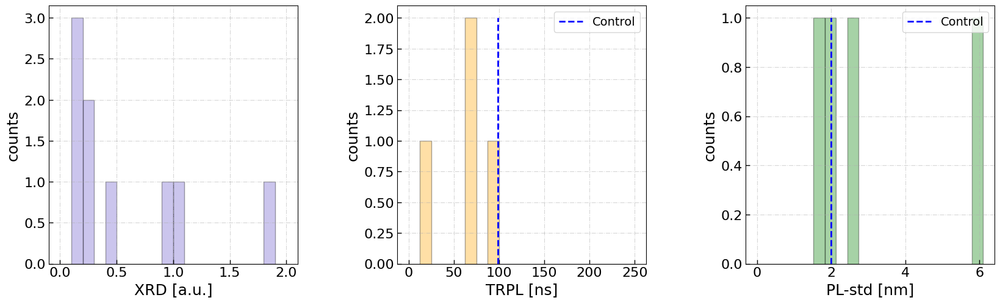

In [13]:
fig,axes = plt.subplots(1, 3, figsize=(20, 5.5), sharey = False)
fs = 20
axes[0].hist(df_cons.iloc[:,-2][:9], bins = 20,edgecolor='black',facecolor='slateblue',range =(0,2),alpha = 0.35)
axes[0].set_xlabel('XRD [a.u.]', fontsize = 18)    
axes[0].set_ylabel('counts', fontsize = 18)
# axes[0].legend(fontsize = fs*0.7)

axes[1].hist(df_obj.iloc[:,-2][:4], bins = 20,edgecolor='black',facecolor='orange',range =(0,250),alpha = 0.35)
axes[1].vlines([99],0,2., linestyles="--", colors='blue',linewidth=2,label = 'Control')
axes[1].set_xlabel('TRPL [ns]', fontsize = 18)    
axes[1].set_ylabel('counts', fontsize = 18)
axes[1].legend(fontsize = fs*0.7)

axes[2].hist(df_obj.iloc[:,-3][:4], bins = 20,edgecolor='black',facecolor='green',range =(0,6.1),alpha = 0.35)
axes[2].vlines([2],0,1., linestyles="--", colors='blue',linewidth=2,label = 'Control')
axes[2].set_xlabel('PL-std [nm]', fontsize = 18)    
axes[2].set_ylabel('counts', fontsize = 18)
axes[2].legend(fontsize = fs*0.7)

for ax in axes:
    ax.tick_params(direction='in', length=5, width=1, labelsize = fs*.8, grid_alpha = 0.5)
    ax.grid(True, linestyle='-.')
plt.subplots_adjust(wspace = 0.4)

plt.show()

In [11]:
x1=df_cons.iloc[:,1:7].values#process conditions
x2=df_obj.iloc[:,1:7].values
x3=df_obj.iloc[:,1:7].values
x1=x_normalizer(x1)
x2=x_normalizer(x2)
x3=x_normalizer(x3)
y1=np.transpose([df_cons.iloc[:,-2].values])#XRD(PbI:PVK)
y2=np.transpose([df_obj.iloc[:,-2].values])#TRPL
y3=np.transpose([df_obj.iloc[:,-3].values])#PL_std

In [12]:
import GPy
from GPy.models import GPRegression
from emukit.model_wrappers import GPyModelWrapper
X1, Y1 = [x1, y1]
X2, Y2 = [x2, y2]
X3, Y3 = [x3, y3]

input_dim = len(X1[0])
ker1 = GPy.kern.Matern52(input_dim = input_dim, ARD =True)
ker1.lengthscale.constrain_bounded(1e-2, 10)
ker1.variance.constrain_bounded(1e-2, 1e3)
yc_offset = np.mean(Y1)
# yc_offset = 0.2
model1_gpy = GPRegression(X1, Y1-yc_offset, ker1)#constraint acquisition computes the probability of < np.mean(XRD)
model1_gpy.Gaussian_noise.variance =0.1**2
model1_gpy.Gaussian_noise.variance.fix()
model1_gpy.randomize()
model1_gpy.optimize_restarts(num_restarts=20,verbose =False, messages=False)
objective_model1 = GPyModelWrapper(model1_gpy)
print(objective_model1.model.kern.lengthscale)
print(objective_model1.model.kern.variance)

input_dim = len(X2[0])
ker2 = GPy.kern.Matern52(input_dim = input_dim, ARD =True)
ker2.lengthscale.constrain_bounded(1e-2, 10)
ker2.variance.constrain_bounded(1e-2, 1e5)
model2_gpy = GPRegression(X2, -Y2, ker2)#Emukit is a minimization tool; need to make Y negative
model2_gpy.Gaussian_noise.variance = (0.1*np.mean(y2))**2
# model2_gpy.Gaussian_noise.variance = 10**2
model2_gpy.Gaussian_noise.variance.fix()
model2_gpy.randomize()
model2_gpy.optimize_restarts(num_restarts=20,verbose =False, messages=False)
objective_model2 = GPyModelWrapper(model2_gpy)
print(objective_model2.model.kern.lengthscale)
print(objective_model2.model.kern.variance)

input_dim = len(X3[0])
ker3 = GPy.kern.Matern52(input_dim = input_dim, ARD =True)
ker3.lengthscale.constrain_bounded(1e-2, 10)
ker3.variance.constrain_bounded(1e-2, 1e4)
model3_gpy = GPRegression(X3, Y3, ker3)
model3_gpy.Gaussian_noise.variance = 0.3**2
model3_gpy.Gaussian_noise.variance.fix()
model3_gpy.randomize()
model3_gpy.optimize_restarts(num_restarts=20,verbose =False, messages=False)
objective_model3 = GPyModelWrapper(model3_gpy)
print(objective_model3.model.kern.lengthscale)
print(objective_model3.model.kern.variance)


f_obj1 =  objective_model1.model.predict
f_obj2 =  objective_model2.model.predict
f_obj3 =  objective_model3.model.predict

y1_pred, y1_uncer = f_obj1(X1)
y1_pred = y1_pred[:,-1]+yc_offset
y2_pred, y2_uncer = f_obj2(X2)
y2_pred = -y2_pred[:,-1]
y3_pred, y3_uncer = f_obj3(X3)
y3_pred = y3_pred[:,-1]

y1_uncer = np.sqrt(y1_uncer[:,-1])
y2_uncer = np.sqrt(y2_uncer[:,-1])
y3_uncer = np.sqrt(y3_uncer[:,-1])

reconstraining parameters Mat52.lengthscale
reconstraining parameters Mat52.variance
reconstraining parameters Mat52.lengthscale
reconstraining parameters Mat52.variance


  index  |  GP_regression.Mat52.lengthscale  |  constraints  |  priors
  [0]    |                       0.25684978  |   0.01,10.0   |        
  [1]    |                       9.99999433  |   0.01,10.0   |        
  [2]    |                       9.99999955  |   0.01,10.0   |        
  [3]    |                       0.57208264  |   0.01,10.0   |        
  [4]    |                       0.58431925  |   0.01,10.0   |        
  [5]    |                       9.99999794  |   0.01,10.0   |        
  index  |  GP_regression.Mat52.variance  |  constraints  |  priors
  [0]    |                    0.36810351  |  0.01,1000.0  |        


reconstraining parameters Mat52.lengthscale
reconstraining parameters Mat52.variance


  index  |  GP_regression.Mat52.lengthscale  |  constraints  |  priors
  [0]    |                       9.99999072  |   0.01,10.0   |        
  [1]    |                       9.99984990  |   0.01,10.0   |        
  [2]    |                       0.24907438  |   0.01,10.0   |        
  [3]    |                       8.40894613  |   0.01,10.0   |        
  [4]    |                       0.41399739  |   0.01,10.0   |        
  [5]    |                       9.99965502  |   0.01,10.0   |        
  index  |  GP_regression.Mat52.variance  |   constraints   |  priors
  [0]    |                15351.35796244  |  0.01,100000.0  |        
  index  |  GP_regression.Mat52.lengthscale  |  constraints  |  priors
  [0]    |                       1.58514554  |   0.01,10.0   |        
  [1]    |                       0.47469954  |   0.01,10.0   |        
  [2]    |                       1.57200171  |   0.01,10.0   |        
  [3]    |                      10.00000000  |   0.01,10.0   |        
  [4]   

xrd rmse: 0.0426
xrd R^2: 0.9921
xrd spearman: 0.9501
TRPL rmse: 2.3171
TRPL R^2: 0.9987
TRPL spearman: 0.9956
PL rmse: 0.1150
PL R^2: 0.9939
PL spearman: 0.9956


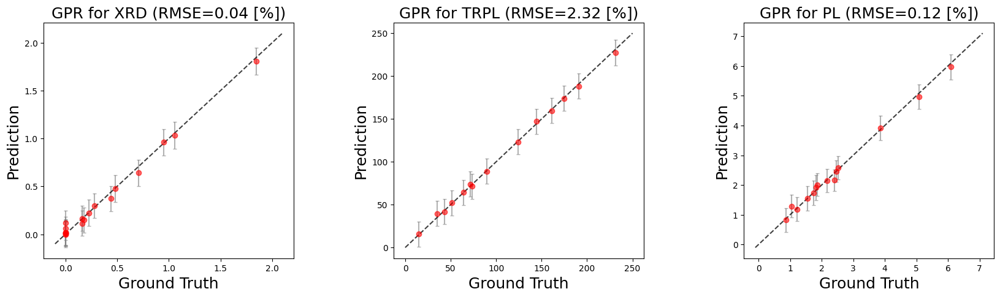

In [93]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from scipy.stats import spearmanr
fig, axes = plt.subplots(1, 3, figsize=(5*4, 5))
fs = 18

lims1 = (-.1, 2.1)
axes[0].scatter(Y1[:,-1], y1_pred, alpha = 0.6, edgecolor = 'r', c = 'r')
axes[0].errorbar(Y1[:,-1], y1_pred, yerr = y1_uncer, ms = 0, 
             ls = '', capsize = 2, alpha = 0.6,
             color = 'gray', zorder = 0)
axes[0].plot(lims1, lims1, 'k--', alpha=0.75, zorder=0)
rmse_value = np.sqrt(mean_squared_error(Y1[:,-1], y1_pred))
title = 'GPR for XRD' + " (RMSE=%.2f" % rmse_value+' [%])'
axes[0].set_xlabel('Ground Truth', fontsize = fs)
axes[0].set_ylabel('Prediction', fontsize = fs)
axes[0].set_title(title, fontsize = fs)
mse = mean_squared_error
mse_xrd = mse(Y1[:,-1], y1_pred)
print ('xrd rmse: %.4f' % (np.sqrt(mse_xrd)))
rsquared_xrd = r2_score(Y1[:,-1], y1_pred)
print ('xrd R^2: %.4f' % (rsquared_xrd))
sprman_xrd = spearmanr(Y1[:,-1], y1_pred)
print ('xrd spearman: %.4f' % (sprman_xrd[0]))

lims2 = (-.1, 250.1)
axes[1].scatter(Y2[:,-1], y2_pred, alpha = 0.6, edgecolor = 'r', c = 'r')
axes[1].errorbar(Y2[:,-1], y2_pred, yerr = y2_uncer, ms = 0, 
             ls = '', capsize = 2, alpha = 0.6,
             color = 'gray', zorder = 0)
axes[1].plot(lims2, lims2, 'k--', alpha=0.75, zorder=0)
rmse_value = np.sqrt(mean_squared_error(Y2[:,-1], y2_pred))
title = 'GPR for TRPL' + " (RMSE=%.2f" % rmse_value+' [%])'
axes[1].set_xlabel('Ground Truth', fontsize = fs)
axes[1].set_ylabel('Prediction', fontsize = fs)
axes[1].set_title(title, fontsize = fs)
mse = mean_squared_error
mse_trpl = mse(Y2[:,-1], y2_pred)
print ('TRPL rmse: %.4f' % (np.sqrt(mse_trpl)))
rsquared_trpl = r2_score(Y2[:,-1], y2_pred)
print ('TRPL R^2: %.4f' % (rsquared_trpl))
sprman_trpl = spearmanr(Y2[:,-1], y2_pred)
print ('TRPL spearman: %.4f' % (sprman_trpl[0]))

lims3 = (-.1, 7.1)
axes[2].scatter(Y3[:,-1], y3_pred, alpha = 0.6, edgecolor = 'r', c = 'r')
axes[2].errorbar(Y3[:,-1], y3_pred, yerr = y3_uncer, ms = 0, 
             ls = '', capsize = 2, alpha = 0.6,
             color = 'gray', zorder = 0)
axes[2].plot(lims3, lims3, 'k--', alpha=0.75, zorder=0)
rmse_value = np.sqrt(mean_squared_error(Y3[:,-1], y3_pred))
title = 'GPR for PL' + " (RMSE=%.2f" % rmse_value+' [%])'
axes[2].set_xlabel('Ground Truth', fontsize = fs)
axes[2].set_ylabel('Prediction', fontsize = fs)
axes[2].set_title(title, fontsize = fs)
mse = mean_squared_error
mse_pl = mse(Y3[:,-1], y3_pred)
print ('PL rmse: %.4f' % (np.sqrt(mse_pl)))
rsquared_pl = r2_score(Y3[:,-1], y3_pred)
print ('PL R^2: %.4f' % (rsquared_pl))
sprman_pl = spearmanr(Y3[:,-1], y3_pred)
print ('PL spearman: %.4f' % (sprman_pl[0]))

plt.subplots_adjust(wspace = 0.4)

In [96]:
from emukit.bayesian_optimization.loops import BayesianOptimizationLoop
from emukit.bayesian_optimization.acquisitions import NegativeLowerConfidenceBound,ProbabilityOfFeasibility,ProbabilityOfImprovement
acquisition1 = NegativeLowerConfidenceBound(objective_model2,beta = 1)
acquisition2 = NegativeLowerConfidenceBound(objective_model3,beta = 1)
# acquisition_constraint = ScaledProbabilityOfFeasibility(objective_model2, max_value = 1, min_value = 0.8)
acquisition_constraint = ProbabilityOfFeasibility(objective_model1)
obj1_plot = -acquisition1.evaluate(x_eva)#LCB of obj1
obj2_plot = -acquisition2.evaluate(x_eva)#LCB of obj2
cons_plot = acquisition_constraint.evaluate(x_eva)

tolerances = np.array([-99,1.97]) 
absolutes = [True, True]
goals = ['min', 'min'] 
chimera = Chimera(tolerances=tolerances, absolutes=absolutes, goals=goals)
obj = np.array([obj1_plot.T[0], obj2_plot.T[0]])
scalarized = chimera.scalarize(obj.T)
cons_acq = (1-scalarized)*cons_plot.T[0]#constrained acquisition

In [58]:
# np.random.seed(10) # to make sure the random results is reproducible 
bs=10
sort_index = np.argsort(cons_acq, axis =0)
X_new = []
top = 47620 # top 1% = 47620/4762065 You should set it according to your confidence in the model (balance of exploitation and exploration)
for i in sort_index[-top:]:
    X_new.append(X_all_grid[i])     
X_new=np.array(X_new)
idx_=[]
for i in np.arange(len(X_new)):
    if X_new[i][1] > 65:
        idx_new=i
        idx_new = np.array(idx_new,dtype=object)
        idx_=np.append(idx_,idx_new)     
X_new = np.delete(X_new,idx_.tolist(),axis=0)  
bs_index = [np.random.randint(len(X_new)) for i in np.arange(bs)]
X_new = X_new[bs_index]
# acq_new1 = acquisition1.evaluate(x_normalizer(X_new))
# acq_new2 = acquisition2.evaluate(x_normalizer(X_new))
cons_pr = acquisition_constraint.evaluate(x_normalizer(X_new))
idx=sort_index[-top:][bs_index]
final_acq=cons_acq[idx]
y_new_pred1, y_new_uncer1 = f_obj2(x_normalizer(X_new))
y_new_pred2, y_new_uncer2 = f_obj3(x_normalizer(X_new))
df_Xnew = pd.DataFrame(X_new, columns = x_labels)
df_all = pd.concat([df_cons.iloc[:,1:7], df_Xnew])
df_all_ = df_all.drop_duplicates()
df_Xnew = df_all_.iloc[len(df_cons):len(df_cons)+bs]
df_Xnew = df_Xnew.sort_values(by=list(df_cons.columns[1:7]), ignore_index = True)
df_Xnew.index = np.arange(len(df_Xnew))+len(df_xrd)
print('New X:',len(df_Xnew))
df_Xnew

New X: 10


,MACl [%],DMF [%],V [KV],Q [uL/min],T [degC],t [min]
22,15.0,0.0,21.5,1.20,150.0,30.0
23,15.0,5.0,24.0,0.80,145.0,15.0
24,15.0,15.0,24.0,0.80,140.0,25.0
25,15.0,20.0,17.5,1.25,150.0,10.0
26,15.0,20.0,24.5,1.40,150.0,15.0
27,15.0,30.0,22.0,1.20,150.0,20.0
28,15.0,30.0,24.0,1.00,145.0,30.0
29,20.0,0.0,28.5,1.40,150.0,15.0
30,20.0,5.0,24.0,1.20,145.0,15.0
31,20.0,5.0,30.0,1.35,150.0,30.0


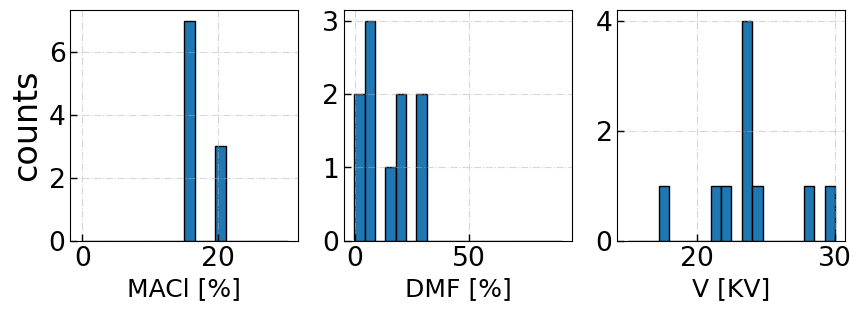

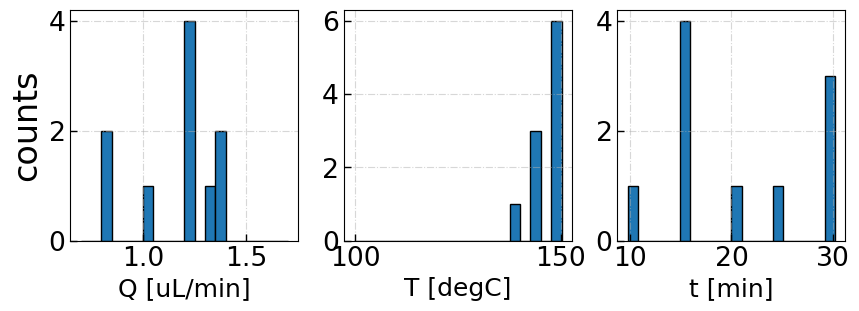

In [59]:
df_x = df_Xnew
df_cols = df_cons.columns
n_col = 3 # num of columns per row in the figure
fs = 20
for n in np.arange(0, 6, n_col):
    fig,axes = plt.subplots(1, n_col, figsize=(10, 3), sharey = False)
    fs = 24
    for i in np.arange(n_col):
        if n< len(df_cols):
            axes[i].hist(df_x.iloc[:,n], bins= 20, range = (min(var_array[n])- 0.05*abs(var_array[n][1]-var_array[n][0]),
                                                            max(var_array[n])+0.05*abs(var_array[n][1]-var_array[n][0])), 
                         edgecolor='black')
            axes[i].set_xlabel(df_cols[n+1], fontsize = 18)


        else:
            axes[i].axis("off")
        n = n+1      
    axes[0].set_ylabel('counts', fontsize = fs)
    for i in range(len(axes)):
        axes[i].tick_params(direction='in', length=5, width=1, labelsize = fs*.8, grid_alpha = 0.5)
        axes[i].grid(True, linestyle='-.')
    plt.show()

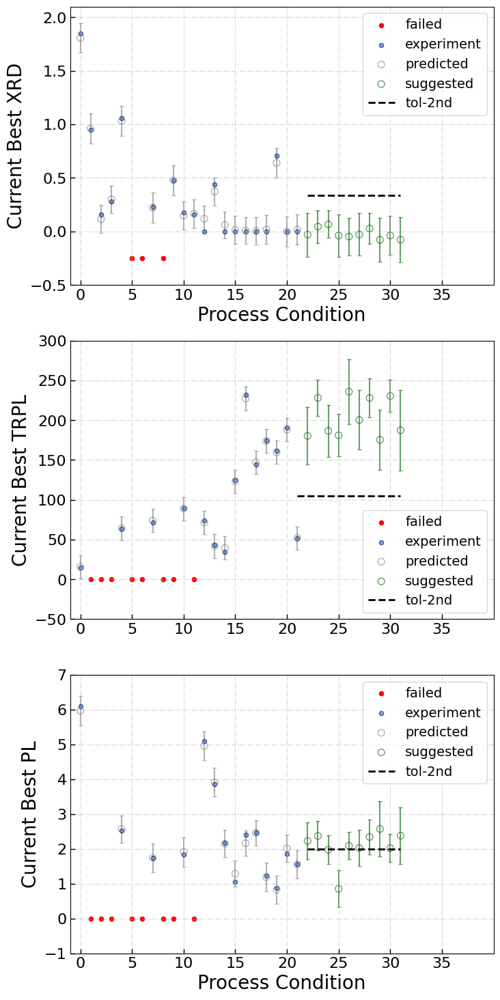

In [60]:
fig, axes = plt.subplots(3, 1, figsize=(8, 18), sharey = False, sharex = False)
fs = 20
film_xrd = df_xrd.sort_values('ML Condition').iloc[:,-2].values
exp_xrd = film_xrd.reshape(-1,1)

data_xrd = df_cons.sort_values('ML Condition').iloc[:,[0,-2]].values
exp_cond = data_xrd[:,0]

f_obj = objective_model1.model.predict
y_pred, y_uncer = f_obj(X1)
y_pred = y_pred[:,-1]+yc_offset
y_uncer = np.sqrt(y_uncer[:,-1])

unsuccess_idx=df_xrd[df_xrd['Success or Fail']==0]['ML Condition'].values
unsuccess_film=df_xrd[df_xrd['Success or Fail']==0]['Success or Fail'].values
unsuccess_film=unsuccess_film-0.25
all_cond = np.concatenate([data_xrd[:,0], np.transpose(unsuccess_idx)])
all_cond = all_cond[np.argsort(all_cond)]

axes[0].scatter(unsuccess_idx, unsuccess_film,
                facecolor = 'r',
                edgecolor = 'r',
                s = 20, label = 'failed')

axes[0].scatter(exp_cond, y1, #facecolor = 'none',
            edgecolor = 'navy', s = 20, alpha = 0.6, label = 'experiment')

axes[0].scatter(exp_cond, y_pred,
                s = 50, facecolors='none', alpha = 0.6, edgecolor = 'gray', label = 'predicted')
axes[0].errorbar(exp_cond, y_pred, yerr = y_uncer,  
                 ms = 1, ls = '', capsize = 2, alpha = 0.6, 
                 color = 'gray', zorder = 0)


y_pred_new, y_uncer_new = f_obj(x_normalizer(df_Xnew.values))
y_pred_new = y_pred_new[:,-1]+yc_offset
y_uncer_new = np.sqrt(y_uncer_new[:,-1])

axes[0].scatter(np.arange(len(df_Xnew))+len(exp_xrd), y_pred_new,
                s = 50, facecolors='none', alpha = 0.6, edgecolor = 'darkgreen', label = 'suggested')
axes[0].errorbar(np.arange(len(df_Xnew))+len(exp_xrd), y_pred_new, yerr = y_uncer_new,  
                 ms = 0, ls = '', capsize = 2, alpha = 0.6, 
                 color = 'darkgreen', zorder = 0)
# axes[0].hlines([0.5], 12,21, linestyles="-",colors='red',linewidth=2,label= 'tol-1st')
axes[0].hlines([0.34], 22,31, linestyles="--", colors='black',linewidth=2,label= 'tol-2nd')


axes[0].set_ylabel('Current Best XRD', fontsize = 20)
axes[0].set_xlabel('Process Condition', fontsize = 20)
axes[0].set_ylim(-.5, 2.1)
axes[0].set_xlim(-1, 40)
axes[0].set_xticks(np.arange(0,40,5))
axes[0].legend(fontsize = fs*0.7)

film_life = df_exp.sort_values('ML Condition').iloc[:,-2].values
exp_life = film_life.reshape(-1,1)

data_life = df_obj.sort_values('ML Condition').iloc[:,[0,-2]].values
exp_cond = data_life[:,0]

f_obj = objective_model2.model.predict
y_pred, y_uncer = f_obj(X2)
y_pred = -y_pred[:,-1]
y_uncer = np.sqrt(y_uncer[:,-1])

unsuccess_idx=df_exp[df_exp['Success or Fail']==0]['ML Condition'].values
unsuccess_film=df_exp[df_exp['Success or Fail']==0]['Success or Fail'].values
unsuccess_film=unsuccess_film
all_cond = np.concatenate([data_life[:,0], np.transpose(unsuccess_idx)])
all_cond = all_cond[np.argsort(all_cond)]

axes[1].scatter(unsuccess_idx, unsuccess_film,
                facecolor = 'r',
                edgecolor = 'r',
                s = 20, label = 'failed')

axes[1].scatter(exp_cond, y2, #facecolor = 'none',
            edgecolor = 'navy', s = 20, alpha = 0.6, label = 'experiment')

axes[1].scatter(exp_cond, y_pred,
                s = 50, facecolors='none', alpha = 0.6, edgecolor = 'gray', label = 'predicted')
axes[1].errorbar(exp_cond, y_pred, yerr = y_uncer,  
                 ms = 1, ls = '', capsize = 2, alpha = 0.6, 
                 color = 'gray', zorder = 0)


y_pred_new, y_uncer_new = f_obj(x_normalizer(df_Xnew.values))
y_pred_new = -y_pred_new[:,-1]
y_uncer_new = np.sqrt(y_uncer_new[:,-1])

axes[1].scatter(np.arange(len(df_Xnew))+len(exp_life), y_pred_new,
                s = 50, facecolors='none', alpha = 0.6, edgecolor = 'darkgreen', label = 'suggested')
axes[1].errorbar(np.arange(len(df_Xnew))+len(exp_life), y_pred_new, yerr = y_uncer_new,  
                 ms = 0, ls = '', capsize = 2, alpha = 0.6, 
                 color = 'darkgreen', zorder = 0)
# axes[1].hlines([200], 12,21, linestyles="-", colors='red',linewidth=2,label= 'tol-1st')
axes[1].hlines([105], 21,31, linestyles="--", colors='black',linewidth=2,label= 'tol-2nd')

axes[1].set_ylabel('Current Best TRPL', fontsize = 20)

axes[1].set_ylim(-50, 300)
axes[1].set_xlim(-1, 40)
axes[1].set_xticks(np.arange(0,40,5))
axes[1].legend(fontsize = fs*0.7,loc=4)


film_uniform = df_exp.sort_values('ML Condition').iloc[:,-3].values
exp_uniform = film_uniform.reshape(-1,1)

data_uniform = df_obj.sort_values('ML Condition').iloc[:,[0,-3]].values
exp_cond = data_uniform[:,0]

f_obj = objective_model3.model.predict
y_pred, y_uncer = f_obj(X3)
y_pred = y_pred[:,-1]
y_uncer = np.sqrt(y_uncer[:,-1])

unsuccess_idx=df_exp[df_exp['Success or Fail']==0]['ML Condition'].values
unsuccess_film=df_exp[df_exp['Success or Fail']==0]['Success or Fail'].values
unsuccess_film=unsuccess_film
all_cond = np.concatenate([data_uniform[:,0], np.transpose(unsuccess_idx)])
all_cond = all_cond[np.argsort(all_cond)]

axes[2].scatter(unsuccess_idx, unsuccess_film,
                facecolor = 'r',
                edgecolor = 'r',
                s = 20, label = 'failed')

axes[2].scatter(exp_cond, y3, #facecolor = 'none',
            edgecolor = 'navy', s = 20, alpha = 0.6, label = 'experiment')

axes[2].scatter(exp_cond, y_pred,
                s = 50, facecolors='none', alpha = 0.6, edgecolor = 'gray', label = 'predicted')
axes[2].errorbar(exp_cond, y_pred, yerr = y_uncer,  
                 ms = 1, ls = '', capsize = 2, alpha = 0.6, 
                 color = 'gray', zorder = 0)


y_pred_new, y_uncer_new = f_obj(x_normalizer(df_Xnew.values))
y_pred_new = y_pred_new[:,-1]
y_uncer_new = np.sqrt(y_uncer_new[:,-1])

axes[2].scatter(np.arange(len(df_Xnew))+len(exp_uniform), y_pred_new,
                s = 50, facecolors='none', alpha = 0.6, edgecolor = 'darkgreen', label = 'suggested')
axes[2].errorbar(np.arange(len(df_Xnew))+len(exp_uniform), y_pred_new, yerr = y_uncer_new,  
                 ms = 0, ls = '', capsize = 2, alpha = 0.6, 
                 color = 'darkgreen', zorder = 0)
# axes[2].hlines([2], 12,21, linestyles="-", colors='r',linewidth=3,label= 'tol-1st')
axes[2].hlines([2], 22,31, linestyles="--", colors='black',linewidth=2,label= 'tol-2nd')

axes[2].set_ylabel('Current Best PL', fontsize = 20)
axes[2].set_xlabel('Process Condition', fontsize = 20)

axes[2].set_ylim(-1, 7)
axes[2].set_xlim(-1, 40)
axes[2].set_xticks(np.arange(0,40,5))
axes[2].legend(fontsize = fs*0.7,loc=1)

for ax in axes:
    ax.tick_params(direction='in', length=5, width=1, labelsize = fs*.8, grid_alpha = 0.5)
    ax.grid(True, linestyle='-.')
plt.subplots_adjust(wspace = 0.4)

plt.show()

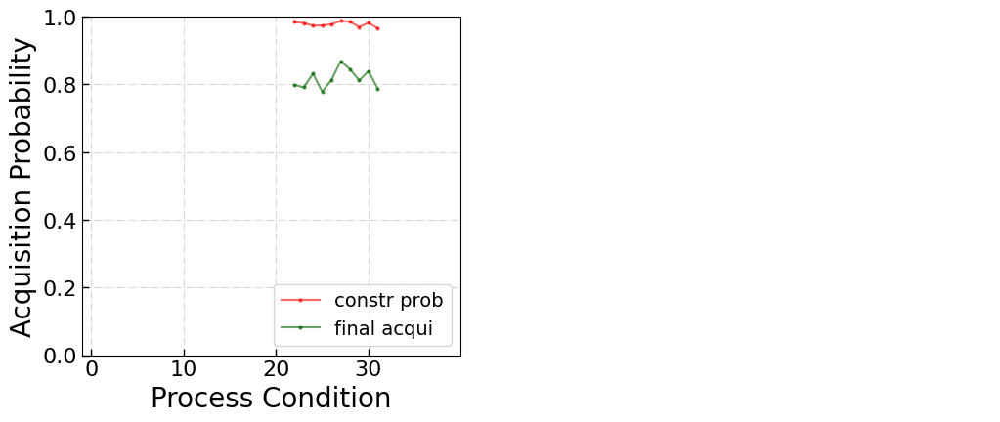

In [61]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4.5), sharey = False)
fs = 20

# axes[0].plot(np.arange(len(df_Xnew))+1+len(X2), acq_new1, marker = 'o',
#                 ms = 2, alpha = 0.6, color = 'orange', label = 'raw acqui1')
# axes[0].plot(np.arange(len(df_Xnew))+1+len(X2), acq_new1, marker = 'o',
#                 ms = 2, alpha = 0.6, color = 'navy', label = 'raw acqui2')
axes[0].plot(np.arange(len(df_Xnew))+3+len(X1), cons_pr, marker = 'o',
                ms = 2, alpha = 0.6, color = 'red', label = 'constr prob')
axes[0].plot(np.arange(len(df_Xnew))+3+len(X1), final_acq, marker = 'o',
                ms = 2, alpha = 0.6, color = 'darkgreen', label = 'final acqui')

axes[0].set_ylim(0., 1)
axes[0].set_xlim(-1, 40)
axes[0].set_xticks(np.arange(0,40,10))
axes[0].set_ylabel('Acquisition Probability', fontsize = fs)
axes[0].set_xlabel('Process Condition', fontsize = fs)
axes[0].legend(fontsize = fs*0.7,loc=4)

axes[1].axis("off")
for ax in axes:
    ax.tick_params(direction='in', length=5, width=1, labelsize = fs*.8, grid_alpha = 0.5)
    ax.grid(True, linestyle='-.')
plt.subplots_adjust(wspace = 0.4)

plt.show()

###MACl、Q、T correlates to XRD, mniimize XRD, see min contour plot 

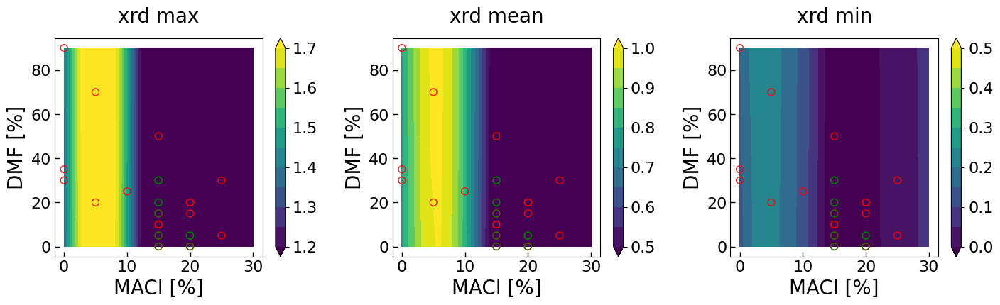

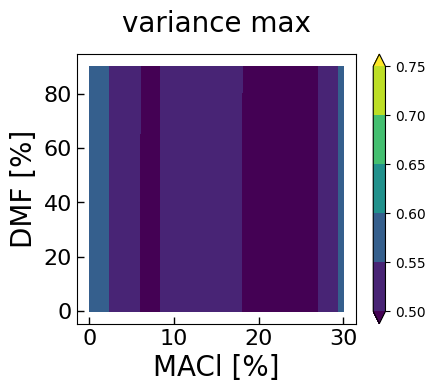

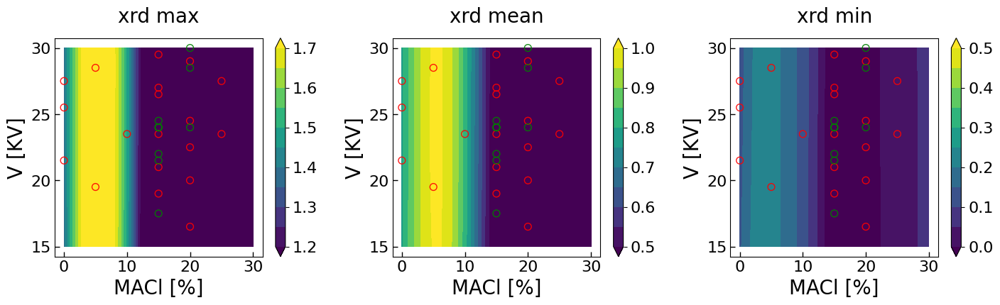

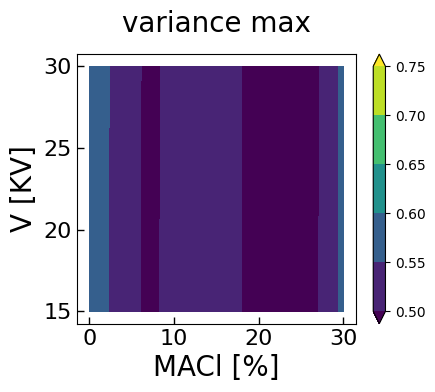

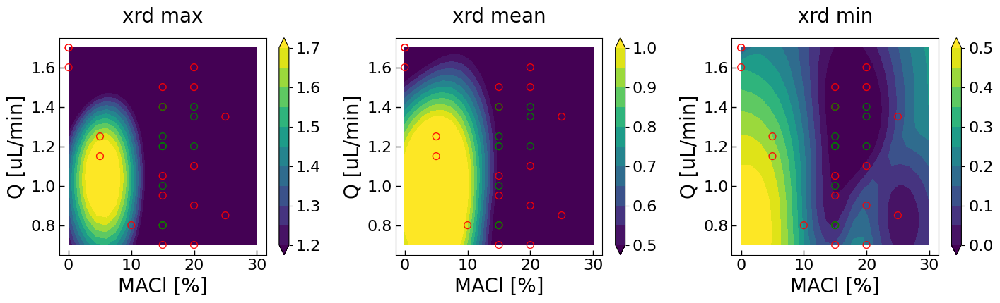

...

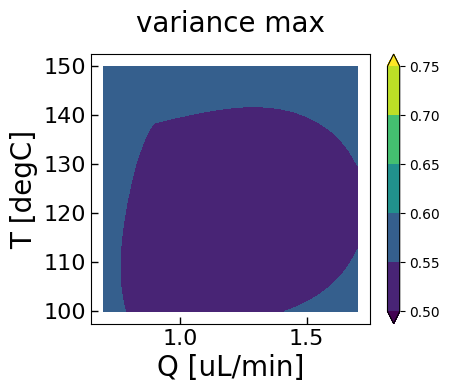

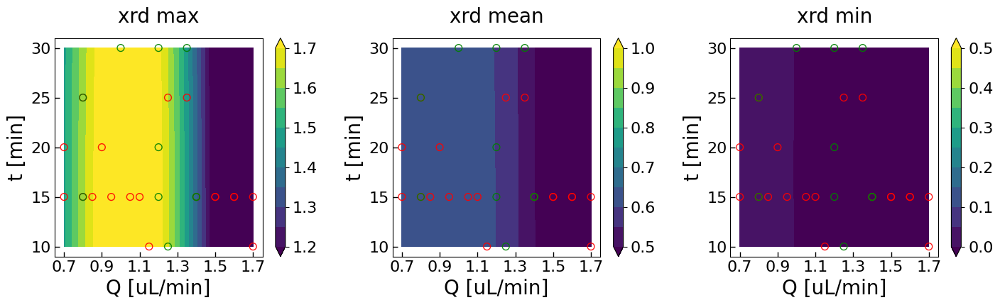

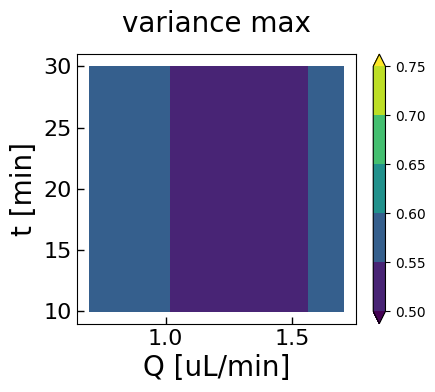

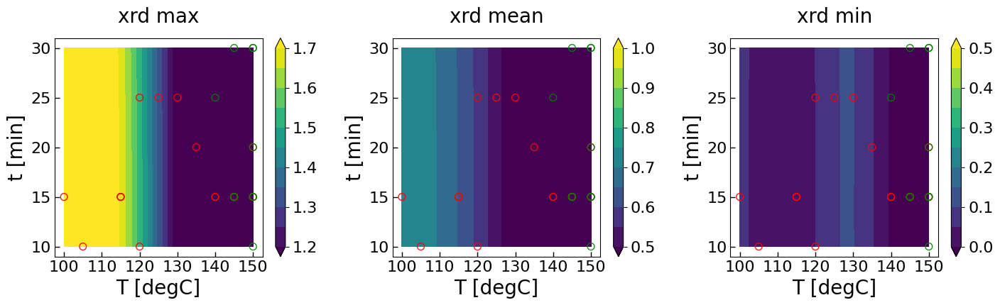

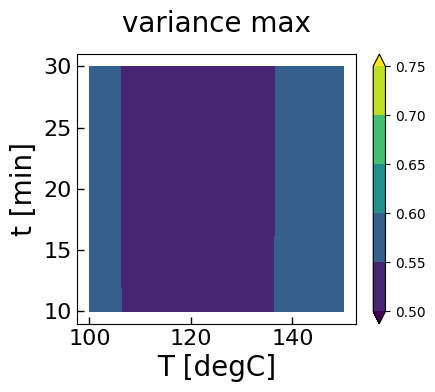

In [62]:
design = RandomDesign(parameter_space)
x_sampled = design.get_samples(200)
x_sampled = x_sampled
input_dim = 6
for i in range(input_dim):
    for j in range(input_dim-i-1):
        ind1 = i
        ind2 = j+i+1
        n_steps =21
        x1x2y_pred, x1x2y_uncer =[[],[]]
        for x1 in np.linspace(0, 1, n_steps):
            for x2 in np.linspace(0, 1, n_steps):
                x_temp = np.copy(x_sampled)
                x_temp[:,ind1] = x1
                x_temp[:,ind2] = x2
                y_pred, y_uncer = f_obj1(x_temp)
                y2 = y_pred+yc_offset
                x1_org = x_denormalizer(x_temp)[0,ind1]
                x2_org = x_denormalizer(x_temp)[0,ind2]
                x1x2y_pred.append([x1_org, x2_org, np.max(y2), np.mean(y2), np.min(y2)])
                x1x2y_uncer.append([x1_org, x2_org, np.max(np.sqrt(y_uncer)), np.mean(np.sqrt(y_uncer)), np.min(np.sqrt(y_uncer))])
        
        x1 = np.array(x1x2y_pred, dtype=object)[:,0].reshape(n_steps, n_steps)
        x2 = np.array(x1x2y_pred, dtype=object)[:,1].reshape(n_steps, n_steps)
            
        y_max2 = np.array(x1x2y_pred, dtype=object)[:,2].reshape(n_steps, n_steps)
        y_mean2 = np.array(x1x2y_pred, dtype=object)[:,3].reshape(n_steps, n_steps)
        y_min2 = np.array(x1x2y_pred, dtype=object)[:,4].reshape(n_steps, n_steps)
        
        y_uncer_max = np.array(x1x2y_uncer, dtype=object)[:,2].reshape(n_steps, n_steps)
        y_uncer_mean = np.array(x1x2y_uncer, dtype=object)[:,3].reshape(n_steps, n_steps)
        y_uncer_min = np.array(x1x2y_uncer, dtype=object)[:,4].reshape(n_steps, n_steps)

        fs = 20
        title_pad = 16
        
        fig,axes = plt.subplots(1, 3, figsize=(17, 4), sharey = False, sharex = False)
#         for ax, y in zip(axes,
#                    [y_max2, y_mean2, y_min2]):
#             c_plt1 = ax.contourf(x1, x2, y,cmap='plasma',extend='both')
        colorbar_offset = [1.2, 0.5, 0]
        for ax, c_offset, y in zip(axes,colorbar_offset,
                           [y_max2, y_mean2, y_min2]):
            c_plt1 = ax.contourf(x1, x2, y,levels = np.arange(11)*0.05+c_offset,cmap='viridis',extend='both')
            cbar = fig.colorbar(c_plt1, ax= ax)
            cbar.ax.tick_params(labelsize=fs*0.8)
            ax.scatter(x_denormalizer(X1)[:, ind1], 
                       x_denormalizer(X1)[:, ind2], 
                       s = 50, facecolors='none', alpha = 0.9, edgecolor = 'red')
            ax.scatter((X_new)[:, ind1], 
                       (X_new)[:, ind2], 
                       s = 50, facecolors='none', alpha = 0.9, edgecolor = 'green')
#             axes[2].contour(x1, x2, y_min2, colors='r',levels=[yc_offset])
            
            ax.set_xlabel(str(x_labels[ind1]),fontsize =  fs)
            ax.set_ylabel(str(x_labels[ind2]),fontsize =  fs)
            
            x1_delta = (np.max(x1)-np.min(x1))*0.05
            x2_delta = (np.max(x2)-np.min(x2))*0.05
            ax.set_xlim(np.min(x1)-x1_delta, np.max(x1)+x1_delta)
            ax.set_ylim(np.min(x2)-x2_delta, np.max(x2)+x2_delta)
            
            ax.tick_params(direction='in', length=5, width=1, labelsize = fs*.8)#, grid_alpha = 0.5
            if ind1==0:#MACl%
                ax.set_xticks([0, 10, 20, 30])
            if ind1==1:#DMF%
                ax.set_xticks([0, 30, 60, 90])
            if ind1==2:#V
                ax.set_xticks([15, 20, 25, 30])
            if ind1==3:#Q
                ax.set_xticks([0.7, 0.9, 1.1, 1.3, 1.5, 1.7])
            if ind1==4:#T
                ax.set_xticks([100, 110, 120, 130, 140, 150])
            if ind1==5:#t
                ax.set_yticks([10, 15, 20, 25, 30])
                
        axes[0].set_title('xrd max', pad = title_pad,fontsize =  fs)
        axes[1].set_title('xrd mean', pad = title_pad,fontsize =  fs)
        axes[2].set_title('xrd min', pad = title_pad,fontsize =  fs)

        plt.subplots_adjust(wspace = 0.3)
        plt.show()
        
        fig,axes = plt.subplots(1, 1, figsize=(4.5, 3.5), sharey =False, sharex = False) 
#         c_plt3 = axes.contourf(x1, x2, y_uncer_max, cmap='plasma',extend='both')
        colorbar_offset = [0.5]
        c_plt3 = axes.contourf(x1, x2, y_uncer_max, levels = np.arange(6)*0.05+colorbar_offset, cmap='viridis',extend='both')
        cbar = fig.colorbar(c_plt3, ax = axes)
        axes.set_xlabel(str(x_labels[ind1]),fontsize =  fs)
        axes.set_ylabel(str(x_labels[ind2]),fontsize =  fs)

        x1_delta = (np.max(x1)-np.min(x1))*0.05
        x2_delta = (np.max(x2)-np.min(x2))*0.05
        axes.set_xlim(np.min(x1)-x1_delta, np.max(x1)+x1_delta)
        axes.set_ylim(np.min(x2)-x2_delta, np.max(x2)+x2_delta)
        axes.tick_params(direction='in', length=5, width=1, labelsize = fs*.8)#, grid_alpha = 0.5
        if ind1==0:#MACl%
                ax.set_xticks([0, 10, 20, 30])
        if ind1==1:#DMF%
            ax.set_xticks([0, 30, 60, 90])
        if ind1==2:#V
            ax.set_xticks([15, 20, 25, 30])
        if ind1==3:#Q
            ax.set_xticks([0.7, 0.9, 1.1, 1.3, 1.5, 1.7])
        if ind1==4:#T
            ax.set_xticks([100, 110, 120, 130, 140, 150])
        if ind1==5:#t
            ax.set_yticks([10, 15, 20, 25, 30])
            
#         axes.scatter(x_denormalizer(X1)[:, 0], 
#                        x_denormalizer(X1)[:, 1], 
#                        s = 50, facecolors='none', alpha = 0.9, edgecolor = 'red')
        axes.set_title('variance max', pad = title_pad,fontsize =  fs)

###MACl、V、T correlates to TRPL, maximize TRPL, see max contour plot 

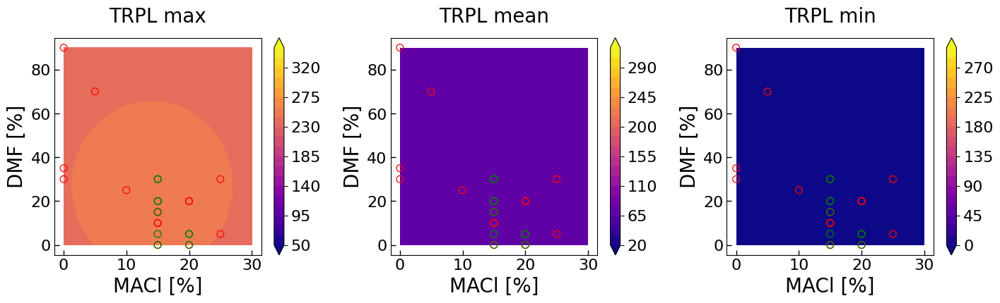

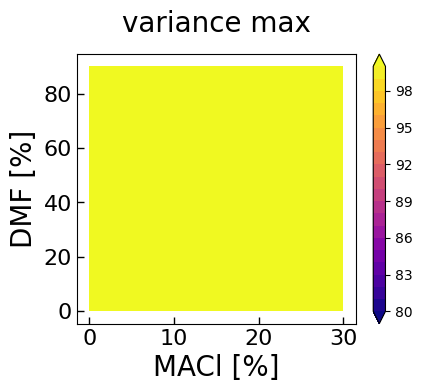

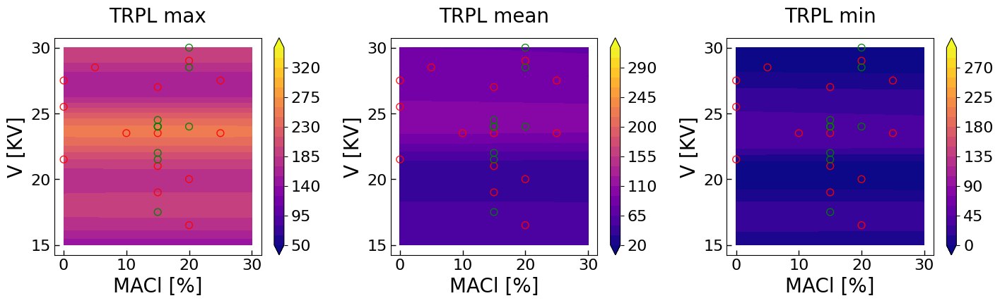

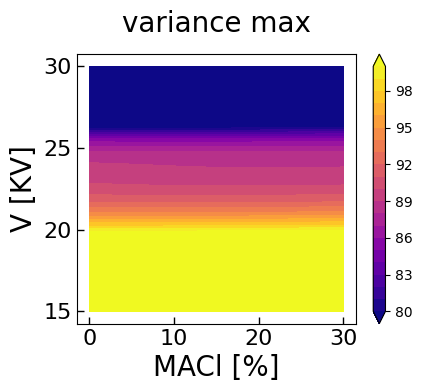

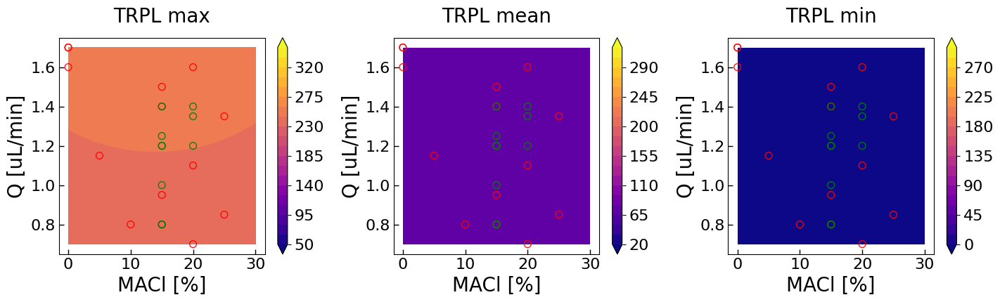

...

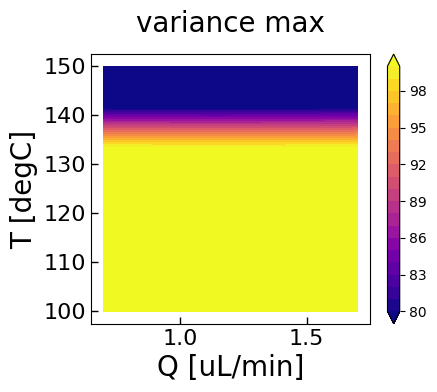

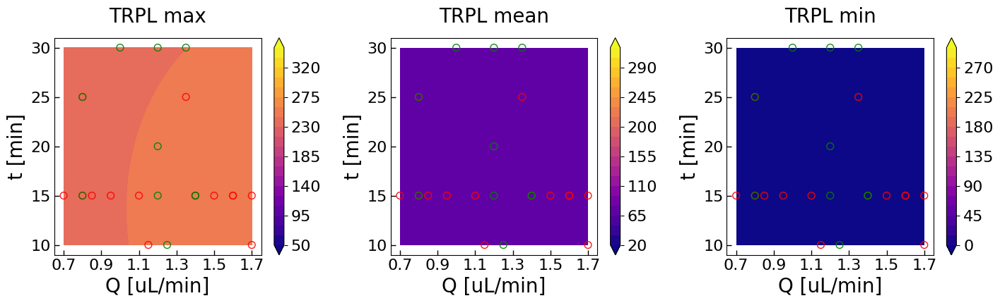

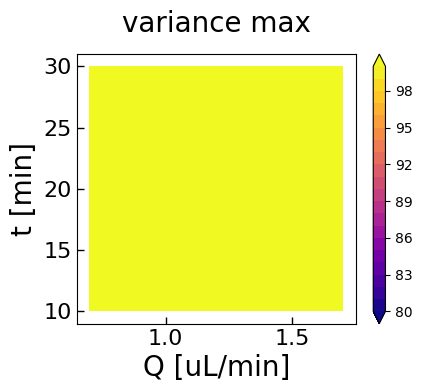

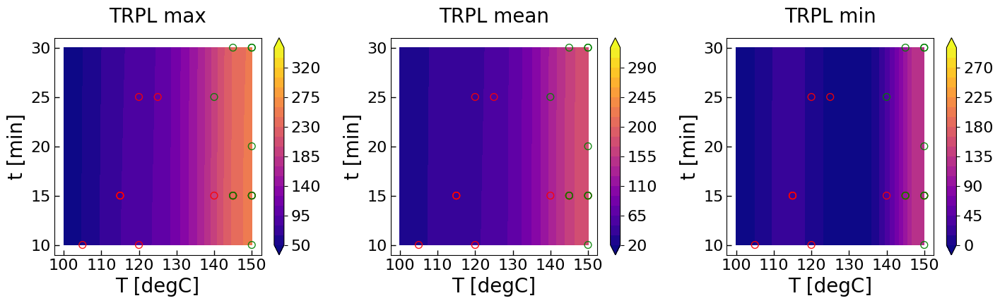

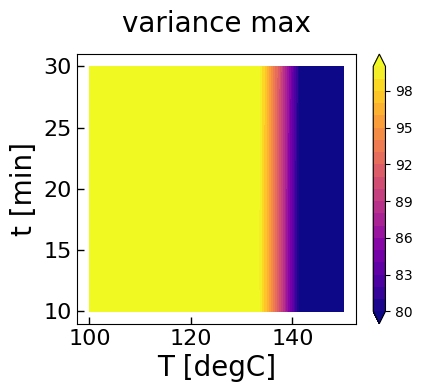

In [63]:
design = RandomDesign(parameter_space)
x_sampled = design.get_samples(200)
x_sampled = x_sampled
input_dim = 6
for i in range(input_dim):
    for j in range(input_dim-i-1):
        ind1 = i
        ind2 = j+i+1
        n_steps =21
        x1x2y_pred, x1x2y_uncer =[[],[]]
        for x1 in np.linspace(0, 1, n_steps):
            for x2 in np.linspace(0, 1, n_steps):
                x_temp = np.copy(x_sampled)
                x_temp[:,ind1] = x1
                x_temp[:,ind2] = x2
                y_pred, y_uncer = f_obj2(x_temp)
                y2 = -y_pred
                x1_org = x_denormalizer(x_temp)[0,ind1]
                x2_org = x_denormalizer(x_temp)[0,ind2]
                x1x2y_pred.append([x1_org, x2_org, np.max(y2), np.mean(y2), np.min(y2)])
                x1x2y_uncer.append([x1_org, x2_org, np.max(np.sqrt(y_uncer)), np.mean(np.sqrt(y_uncer)), np.min(np.sqrt(y_uncer))])
        
        x1 = np.array(x1x2y_pred, dtype=object)[:,0].reshape(n_steps, n_steps)
        x2 = np.array(x1x2y_pred, dtype=object)[:,1].reshape(n_steps, n_steps)
            
        y_max2 = np.array(x1x2y_pred, dtype=object)[:,2].reshape(n_steps, n_steps)
        y_mean2 = np.array(x1x2y_pred, dtype=object)[:,3].reshape(n_steps, n_steps)
        y_min2 = np.array(x1x2y_pred, dtype=object)[:,4].reshape(n_steps, n_steps)
        
        y_uncer_max = np.array(x1x2y_uncer, dtype=object)[:,2].reshape(n_steps, n_steps)
        y_uncer_mean = np.array(x1x2y_uncer, dtype=object)[:,3].reshape(n_steps, n_steps)
        y_uncer_min = np.array(x1x2y_uncer, dtype=object)[:,4].reshape(n_steps, n_steps)

        fs = 20
        title_pad = 16
        
        fig,axes = plt.subplots(1, 3, figsize=(17, 4), sharey = False, sharex = False)
#         for ax, y in zip(axes,
#                            [y_max2, y_mean2, y_min2]):
#             c_plt1 = ax.contourf(x1, x2, y,cmap='plasma',extend='both')
        colorbar_offset = [50, 20, 0]
        for ax, c_offset, y in zip(axes,colorbar_offset,
                           [y_max2, y_mean2, y_min2]):
            c_plt1 = ax.contourf(x1, x2, y,levels = np.arange(21)*15+c_offset,cmap='plasma',extend='both')
            cbar = fig.colorbar(c_plt1, ax= ax)
            cbar.ax.tick_params(labelsize=fs*0.8)
            ax.scatter(x_denormalizer(X2)[:, ind1], 
                       x_denormalizer(X2)[:, ind2], 
                       s = 50, facecolors='none', alpha = 0.9, edgecolor = 'red')
            ax.scatter((X_new)[:, ind1], 
                       (X_new)[:, ind2], 
                       s = 50, facecolors='none', alpha = 0.9, edgecolor = 'green')
#             axes[0].contour(x1, x2, y_max2, colors='b',levels=[70])
            
            ax.set_xlabel(str(x_labels[ind1]),fontsize =  fs)
            ax.set_ylabel(str(x_labels[ind2]),fontsize =  fs)
            
            x1_delta = (np.max(x1)-np.min(x1))*0.05
            x2_delta = (np.max(x2)-np.min(x2))*0.05
            ax.set_xlim(np.min(x1)-x1_delta, np.max(x1)+x1_delta)
            ax.set_ylim(np.min(x2)-x2_delta, np.max(x2)+x2_delta)
            
            ax.tick_params(direction='in', length=5, width=1, labelsize = fs*.8)#, grid_alpha = 0.5
            if ind1==0:#MACl%
                ax.set_xticks([0, 10, 20, 30])
            if ind1==1:#DMF%
                ax.set_xticks([0, 30, 60, 90])
            if ind1==2:#V
                ax.set_xticks([15, 20, 25, 30])
            if ind1==3:#Q
                ax.set_xticks([0.7, 0.9, 1.1, 1.3, 1.5, 1.7])
            if ind1==4:#T
                ax.set_xticks([100, 110, 120, 130, 140, 150])
            if ind1==5:#t
                ax.set_yticks([10, 15, 20, 25, 30])
                
        axes[0].set_title('TRPL max', pad = title_pad,fontsize =  fs)
        axes[1].set_title('TRPL mean', pad = title_pad,fontsize =  fs)
        axes[2].set_title('TRPL min', pad = title_pad,fontsize =  fs)

        plt.subplots_adjust(wspace = 0.3)
        plt.show()
        
        fig,axes = plt.subplots(1, 1, figsize=(4.5, 3.5), sharey =False, sharex = False) 
#         c_plt3 = axes.contourf(x1, x2, y_uncer_max, cmap='plasma',extend='both')
        colorbar_offset = [80]
        c_plt3 = axes.contourf(x1, x2, y_uncer_max, levels = np.arange(21)+colorbar_offset, cmap='plasma',extend='both')
        cbar = fig.colorbar(c_plt3, ax = axes)
        axes.set_xlabel(str(x_labels[ind1]),fontsize =  fs)
        axes.set_ylabel(str(x_labels[ind2]),fontsize =  fs)

        x1_delta = (np.max(x1)-np.min(x1))*0.05
        x2_delta = (np.max(x2)-np.min(x2))*0.05
        axes.set_xlim(np.min(x1)-x1_delta, np.max(x1)+x1_delta)
        axes.set_ylim(np.min(x2)-x2_delta, np.max(x2)+x2_delta)
        axes.tick_params(direction='in', length=5, width=1, labelsize = fs*.8)#, grid_alpha = 0.5
        if ind1==0:#MACl%
                ax.set_xticks([0, 10, 20, 30])
        if ind1==1:#DMF%
            ax.set_xticks([0, 30, 60, 90])
        if ind1==2:#V
            ax.set_xticks([15, 20, 25, 30])
        if ind1==3:#Q
            ax.set_xticks([0.7, 0.9, 1.1, 1.3, 1.5, 1.7])
        if ind1==4:#T
            ax.set_xticks([100, 110, 120, 130, 140, 150])
        if ind1==5:#t
            ax.set_yticks([10, 15, 20, 25, 30])
            
#         axes.scatter(x_denormalizer(X1)[:, 0], 
#                        x_denormalizer(X1)[:, 1], 
#                        s = 50, facecolors='none', alpha = 0.9, edgecolor = 'red')
        axes.set_title('variance max', pad = title_pad,fontsize =  fs)

###MACl、DMF、V correlates to PL, minimize PL, see min contour plot 

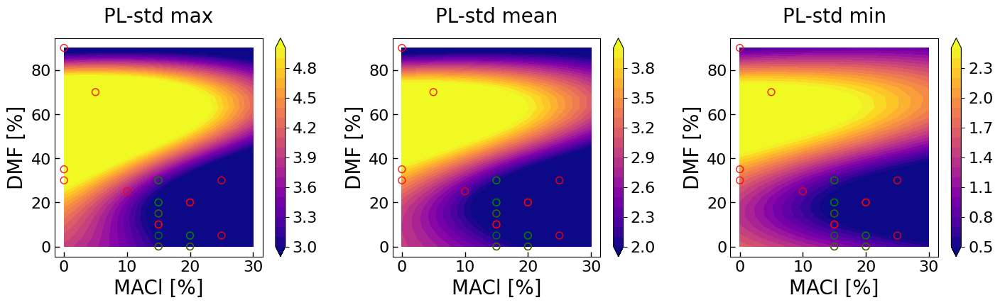

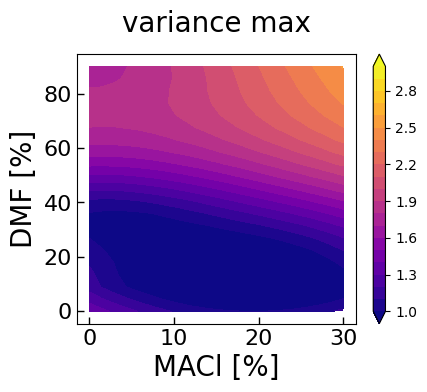

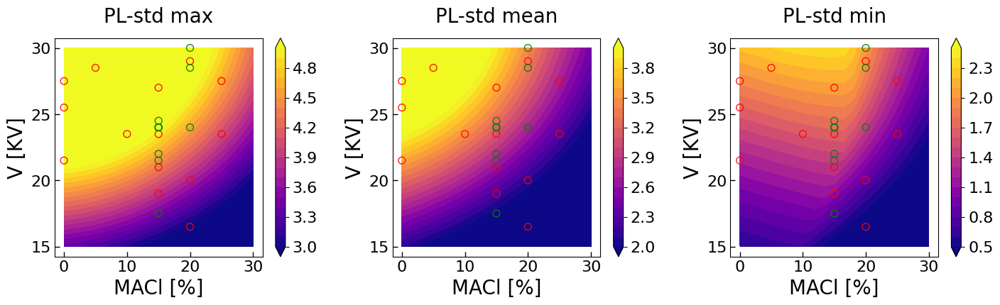

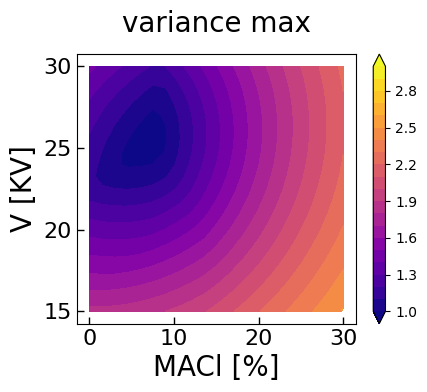

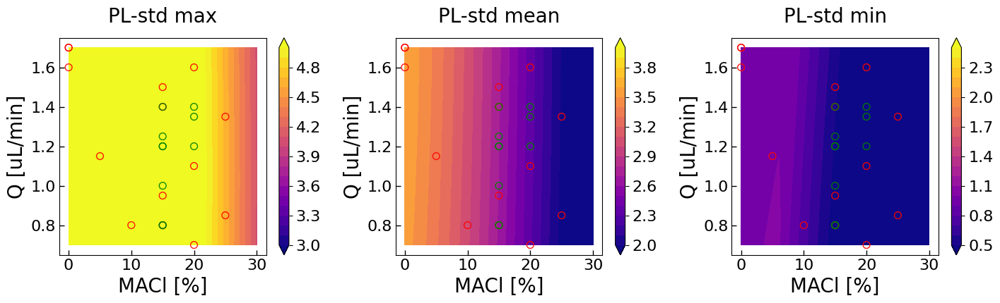

...

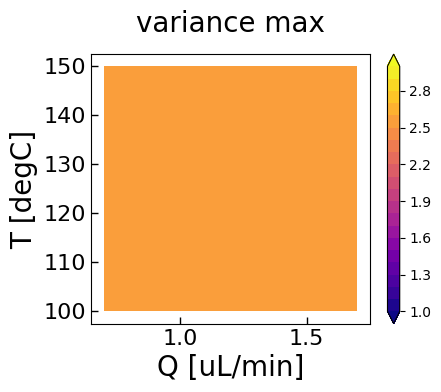

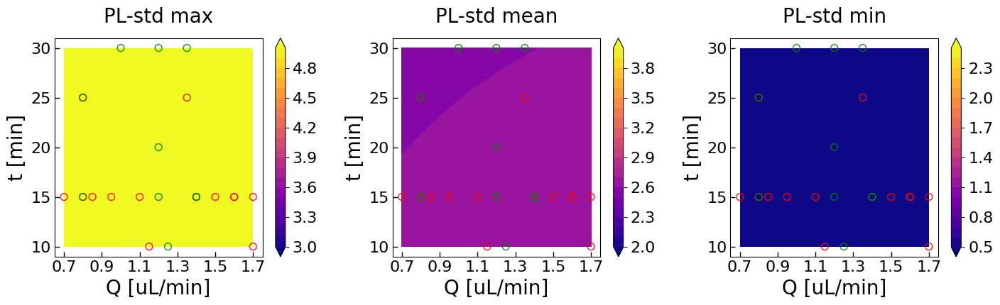

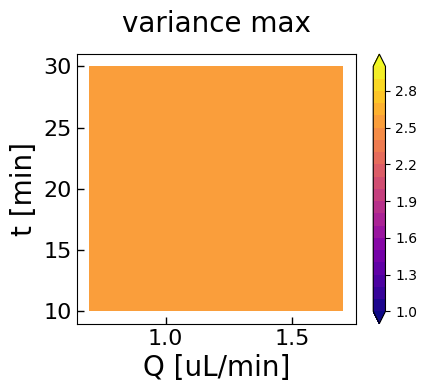

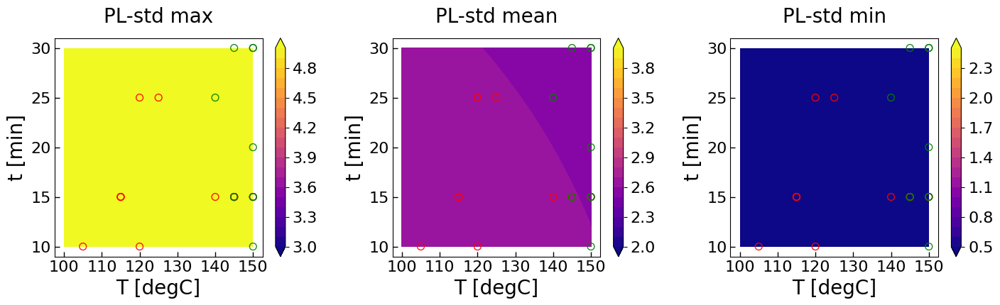

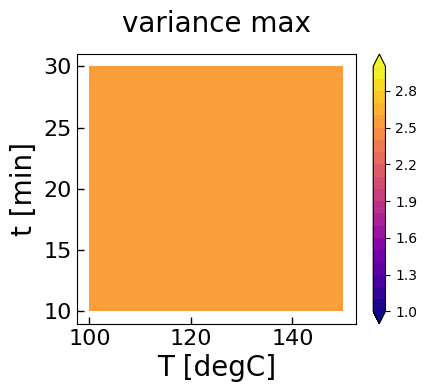

In [64]:
design = RandomDesign(parameter_space)
x_sampled = design.get_samples(200)
x_sampled = x_sampled
input_dim = 6
for i in range(input_dim):
    for j in range(input_dim-i-1):
        ind1 = i
        ind2 = j+i+1
        n_steps =21
        x1x2y_pred, x1x2y_uncer =[[],[]]
        for x1 in np.linspace(0, 1, n_steps):
            for x2 in np.linspace(0, 1, n_steps):
                x_temp = np.copy(x_sampled)
                x_temp[:,ind1] = x1
                x_temp[:,ind2] = x2
                y_pred, y_uncer = f_obj3(x_temp)
                y2 = y_pred
                x1_org = x_denormalizer(x_temp)[0,ind1]
                x2_org = x_denormalizer(x_temp)[0,ind2]
                x1x2y_pred.append([x1_org, x2_org, np.max(y2), np.mean(y2), np.min(y2)])
                x1x2y_uncer.append([x1_org, x2_org, np.max(np.sqrt(y_uncer)), np.mean(np.sqrt(y_uncer)), np.min(np.sqrt(y_uncer))])
        
        x1 = np.array(x1x2y_pred, dtype=object)[:,0].reshape(n_steps, n_steps)
        x2 = np.array(x1x2y_pred, dtype=object)[:,1].reshape(n_steps, n_steps)
            
        y_max2 = np.array(x1x2y_pred, dtype=object)[:,2].reshape(n_steps, n_steps)
        y_mean2 = np.array(x1x2y_pred, dtype=object)[:,3].reshape(n_steps, n_steps)
        y_min2 = np.array(x1x2y_pred, dtype=object)[:,4].reshape(n_steps, n_steps)
        
        y_uncer_max = np.array(x1x2y_uncer, dtype=object)[:,2].reshape(n_steps, n_steps)
        y_uncer_mean = np.array(x1x2y_uncer, dtype=object)[:,3].reshape(n_steps, n_steps)
        y_uncer_min = np.array(x1x2y_uncer, dtype=object)[:,4].reshape(n_steps, n_steps)

        fs = 20
        title_pad = 16
        
        fig,axes = plt.subplots(1, 3, figsize=(17, 4), sharey = False, sharex = False)
#         for ax, y in zip(axes,
#                            [y_max2, y_mean2, y_min2]):
#             c_plt1 = ax.contourf(x1, x2, y,cmap='plasma',extend='both')
        colorbar_offset = [3, 2, 0.5]
        for ax, c_offset, y in zip(axes,colorbar_offset,
                           [y_max2, y_mean2, y_min2]):
            c_plt1 = ax.contourf(x1, x2, y,levels = np.arange(21)/10+c_offset,cmap='plasma',extend='both')
            cbar = fig.colorbar(c_plt1, ax= ax)
            cbar.ax.tick_params(labelsize=fs*0.8)
            ax.scatter(x_denormalizer(X3)[:, ind1], 
                       x_denormalizer(X3)[:, ind2], 
                       s = 50, facecolors='none', alpha = 0.9, edgecolor = 'red')
            ax.scatter((X_new)[:, ind1], 
                       (X_new)[:, ind2], 
                       s = 50, facecolors='none', alpha = 0.9, edgecolor = 'green')
#             axes[2].contour(x1, x2, y_min2, colors='b',levels=[2])
            
            ax.set_xlabel(str(x_labels[ind1]),fontsize =  fs)
            ax.set_ylabel(str(x_labels[ind2]),fontsize =  fs)
            
            x1_delta = (np.max(x1)-np.min(x1))*0.05
            x2_delta = (np.max(x2)-np.min(x2))*0.05
            ax.set_xlim(np.min(x1)-x1_delta, np.max(x1)+x1_delta)
            ax.set_ylim(np.min(x2)-x2_delta, np.max(x2)+x2_delta)
            
            ax.tick_params(direction='in', length=5, width=1, labelsize = fs*.8)#, grid_alpha = 0.5
            if ind1==0:#MACl%
                ax.set_xticks([0, 10, 20, 30])
            if ind1==1:#DMF%
                ax.set_xticks([0, 30, 60, 90])
            if ind1==2:#V
                ax.set_xticks([15, 20, 25, 30])
            if ind1==3:#Q
                ax.set_xticks([0.7, 0.9, 1.1, 1.3, 1.5, 1.7])
            if ind1==4:#T
                ax.set_xticks([100, 110, 120, 130, 140, 150])
            if ind1==5:#t
                ax.set_yticks([10, 15, 20, 25, 30])
                
        axes[0].set_title('PL-std max', pad = title_pad,fontsize =  fs)
        axes[1].set_title('PL-std mean', pad = title_pad,fontsize =  fs)
        axes[2].set_title('PL-std min', pad = title_pad,fontsize =  fs)

        plt.subplots_adjust(wspace = 0.3)
        plt.show()
        
        fig,axes = plt.subplots(1, 1, figsize=(4.5, 3.5), sharey =False, sharex = False) 
#         c_plt3 = axes.contourf(x1, x2, y_uncer_max, cmap='plasma',extend='both')
        colorbar_offset = [1]
        c_plt3 = axes.contourf(x1, x2, y_uncer_max, levels = np.arange(21)*0.1+colorbar_offset, cmap='plasma',extend='both')
        cbar = fig.colorbar(c_plt3, ax = axes)
        axes.set_xlabel(str(x_labels[ind1]),fontsize =  fs)
        axes.set_ylabel(str(x_labels[ind2]),fontsize =  fs)

        x1_delta = (np.max(x1)-np.min(x1))*0.05
        x2_delta = (np.max(x2)-np.min(x2))*0.05
        axes.set_xlim(np.min(x1)-x1_delta, np.max(x1)+x1_delta)
        axes.set_ylim(np.min(x2)-x2_delta, np.max(x2)+x2_delta)
        axes.tick_params(direction='in', length=5, width=1, labelsize = fs*.8)#, grid_alpha = 0.5
        if ind1==0:#MACl%
                ax.set_xticks([0, 10, 20, 30])
        if ind1==1:#DMF%
            ax.set_xticks([0, 30, 60, 90])
        if ind1==2:#V
            ax.set_xticks([15, 20, 25, 30])
        if ind1==3:#Q
            ax.set_xticks([0.7, 0.9, 1.1, 1.3, 1.5, 1.7])
        if ind1==4:#T
            ax.set_xticks([100, 110, 120, 130, 140, 150])
        if ind1==5:#t
            ax.set_yticks([10, 15, 20, 25, 30])
            
#         axes.scatter(x_denormalizer(X1)[:, 0], 
#                        x_denormalizer(X1)[:, 1], 
#                        s = 50, facecolors='none', alpha = 0.9, edgecolor = 'red')
        axes.set_title('variance max', pad = title_pad,fontsize =  fs)

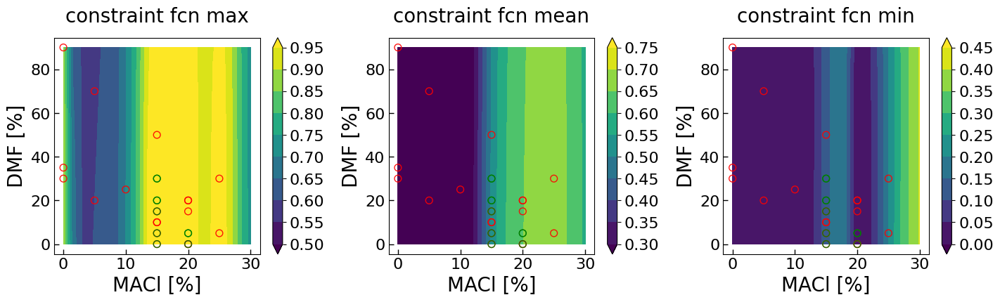

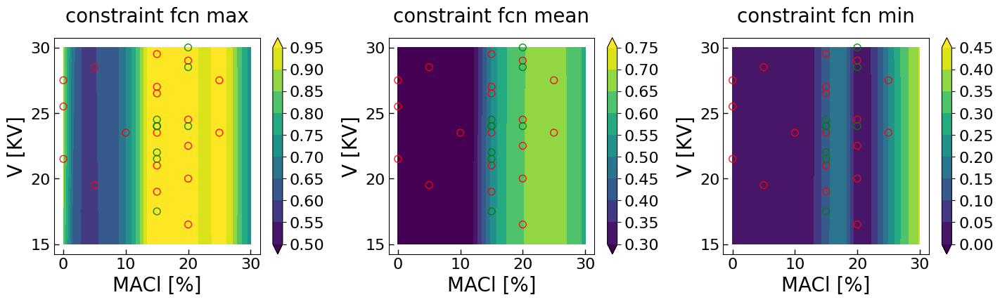

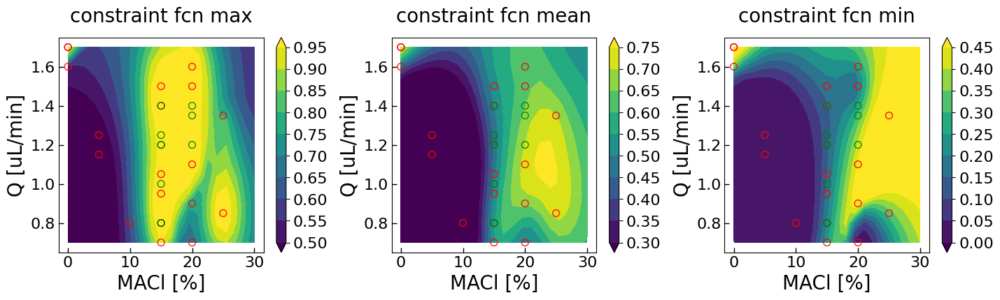

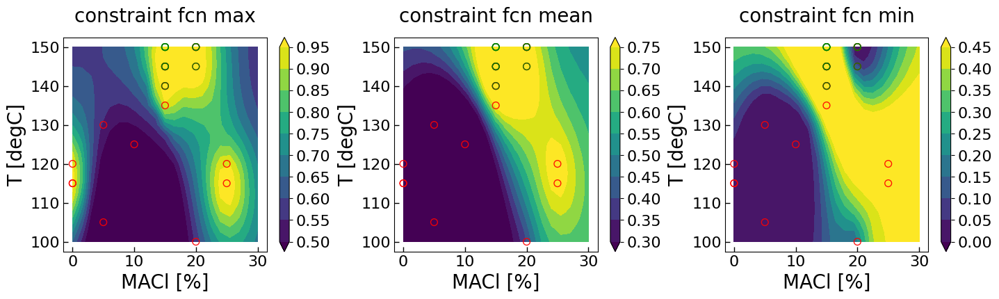

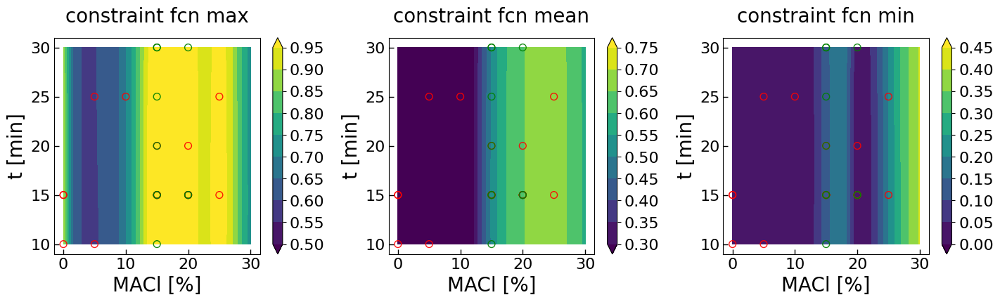

...

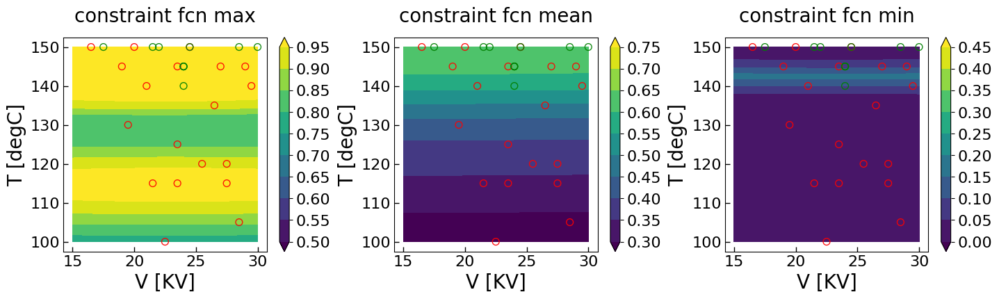

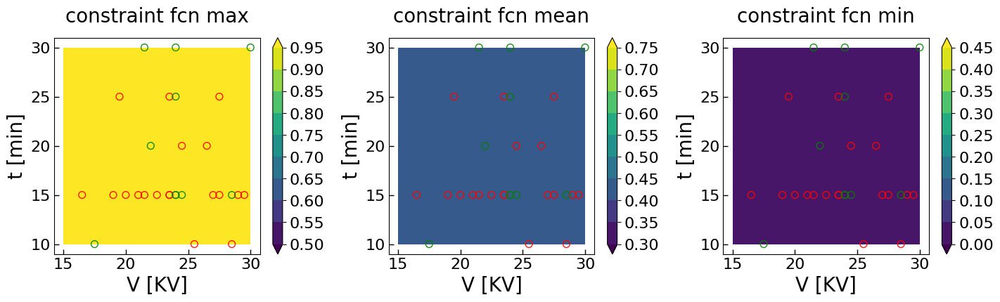

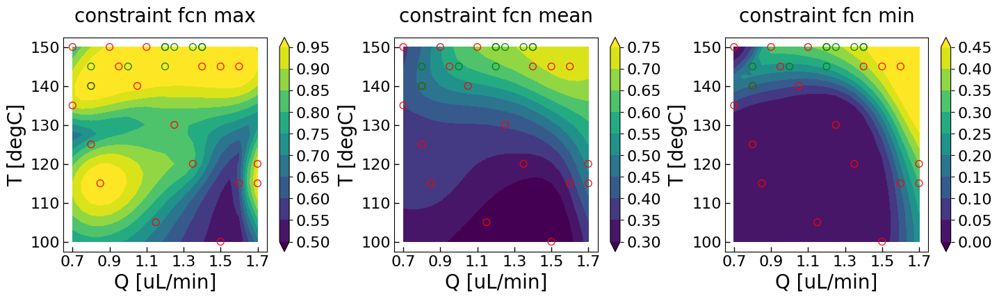

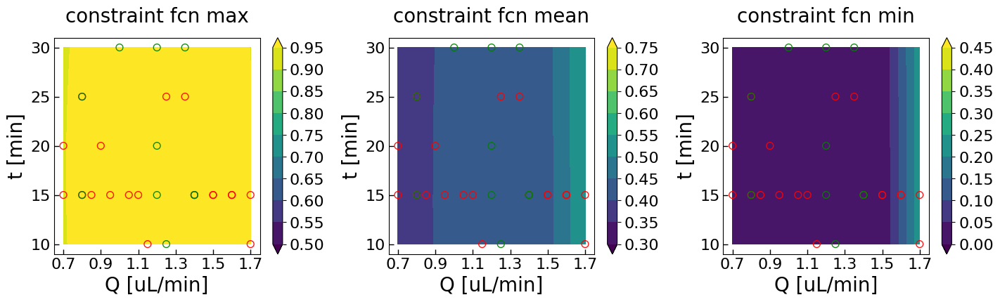

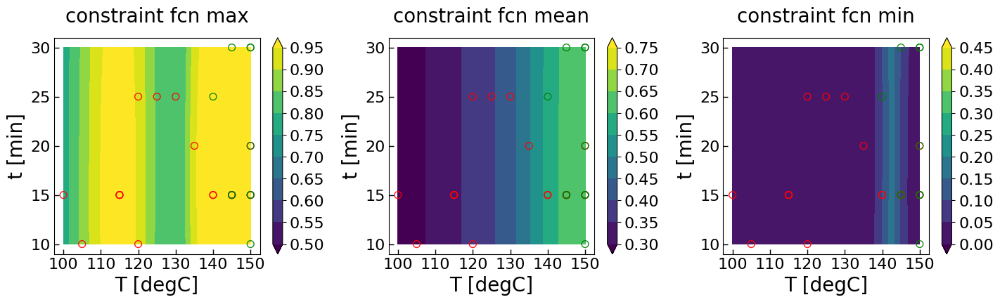

In [65]:
design = RandomDesign(parameter_space)
x_sampled = design.get_samples(200)
x_sampled = x_sampled
input_dim = 6
for i in range(input_dim):
    for j in range(input_dim-i-1):
        ind1 = i
        ind2 = j+i+1
        n_steps =21
        x1x2y_pred, x1x2y_uncer =[[],[]]
        for x1 in np.linspace(0, 1, n_steps):
            for x2 in np.linspace(0, 1, n_steps):
                x_temp = np.copy(x_sampled)
                x_temp[:,ind1] = x1
                x_temp[:,ind2] = x2
                y_pred = acquisition_constraint.evaluate(x_temp)
                y2 = y_pred
                x1_org = x_denormalizer(x_temp)[0,ind1]
                x2_org = x_denormalizer(x_temp)[0,ind2]
                x1x2y_pred.append([x1_org, x2_org, np.max(y2), np.mean(y2), np.min(y2)])
        
        x1 = np.array(x1x2y_pred, dtype=object)[:,0].reshape(n_steps, n_steps)
        x2 = np.array(x1x2y_pred, dtype=object)[:,1].reshape(n_steps, n_steps)
            
        y_max2 = np.array(x1x2y_pred, dtype=object)[:,2].reshape(n_steps, n_steps)
        y_mean2 = np.array(x1x2y_pred, dtype=object)[:,3].reshape(n_steps, n_steps)
        y_min2 = np.array(x1x2y_pred, dtype=object)[:,4].reshape(n_steps, n_steps)
   
        fs = 20
        title_pad = 16
        
        fig,axes = plt.subplots(1, 3, figsize=(17, 4), sharey = False, sharex = False)
#         for ax, y in zip(axes,
#                            [y_max2, y_mean2, y_min2]):
#             c_plt1 = ax.contourf(x1, x2, y,cmap='plasma',extend='both')
        colorbar_offset = [0.5, 0.3, 0]
        for ax, c_offset, y in zip(axes,colorbar_offset,
                           [y_max2, y_mean2, y_min2]):
            c_plt1 = ax.contourf(x1, x2, y/max(y_max2.flatten()),levels =np.arange(10)*0.05+c_offset,cmap='viridis',extend='both')
            cbar = fig.colorbar(c_plt1, ax= ax)
            cbar.ax.tick_params(labelsize=fs*0.8)
            ax.scatter(x_denormalizer(X1)[:, ind1], 
                       x_denormalizer(X1)[:, ind2], 
                       s = 50, facecolors='none', alpha = 0.9, edgecolor = 'red')
            ax.scatter((X_new)[:, ind1], 
                       (X_new)[:, ind2], 
                       s = 50, facecolors='none', alpha = 0.9, edgecolor = 'green')
            ax.set_xlabel(str(x_labels[ind1]),fontsize =  fs)
            ax.set_ylabel(str(x_labels[ind2]),fontsize =  fs)
            
            x1_delta = (np.max(x1)-np.min(x1))*0.05
            x2_delta = (np.max(x2)-np.min(x2))*0.05
            ax.set_xlim(np.min(x1)-x1_delta, np.max(x1)+x1_delta)
            ax.set_ylim(np.min(x2)-x2_delta, np.max(x2)+x2_delta)
            
            ax.tick_params(direction='in', length=5, width=1, labelsize = fs*.8)#, grid_alpha = 0.5
            if ind1==0:#MACl%
                ax.set_xticks([0, 10, 20, 30])
            if ind1==1:#DMF%
                ax.set_xticks([0, 30, 60, 90])
            if ind1==2:#V
                ax.set_xticks([15, 20, 25, 30])
            if ind1==3:#Q
                ax.set_xticks([0.7, 0.9, 1.1, 1.3, 1.5, 1.7])
            if ind1==4:#T
                ax.set_xticks([100, 110, 120, 130, 140, 150])
            if ind1==5:#t
                ax.set_yticks([10, 15, 20, 25, 30])
                
        axes[0].set_title('constraint fcn max', pad = title_pad,fontsize =  fs)
        axes[1].set_title('constraint fcn mean', pad = title_pad,fontsize =  fs)
        axes[2].set_title('constraint fcn min', pad = title_pad,fontsize =  fs)

        plt.subplots_adjust(wspace = 0.3)
        plt.show()

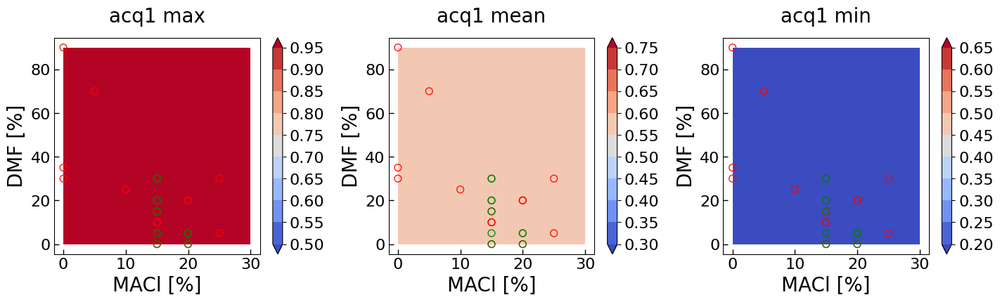

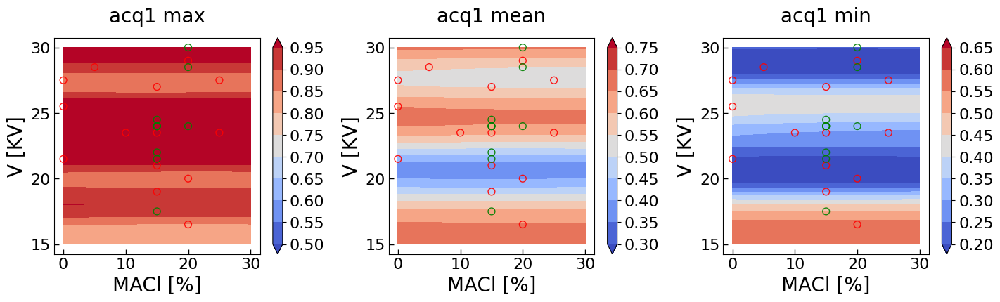

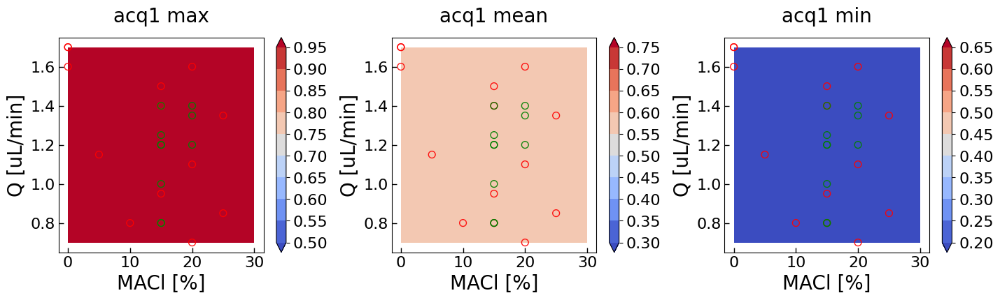

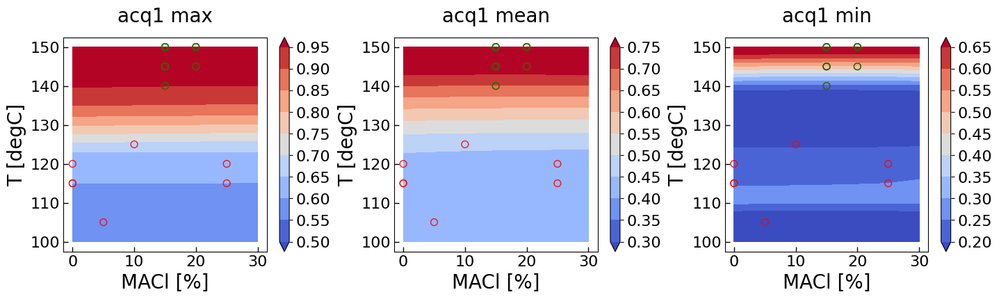

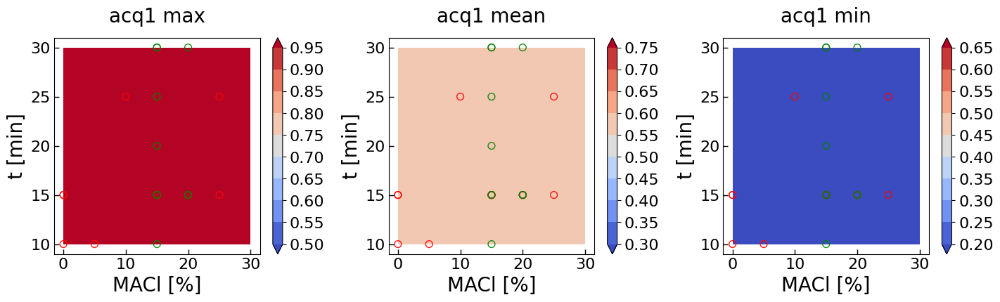

...

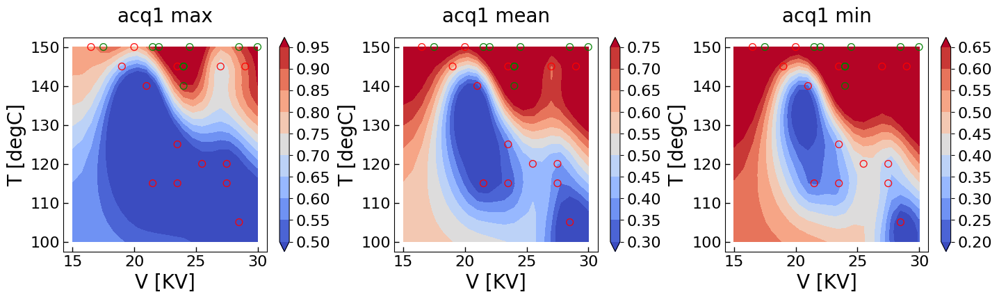

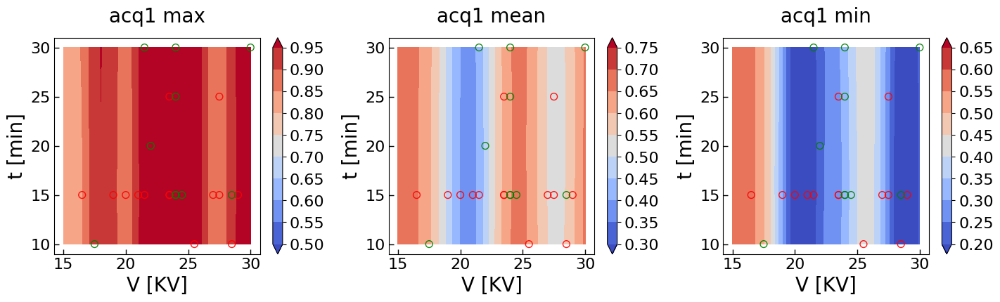

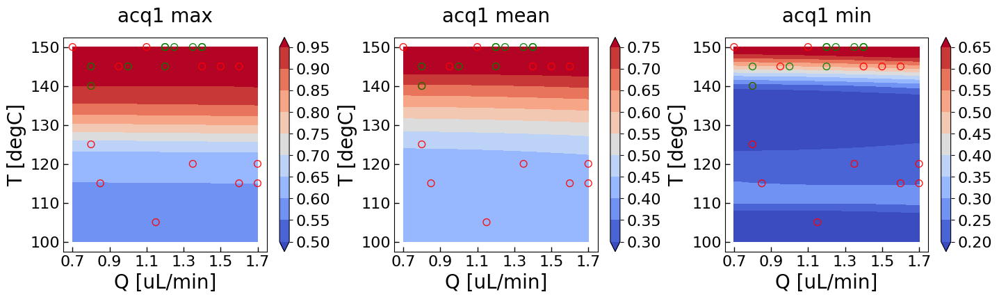

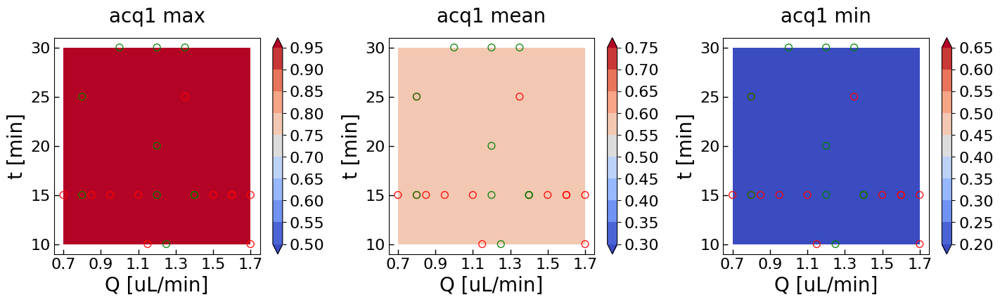

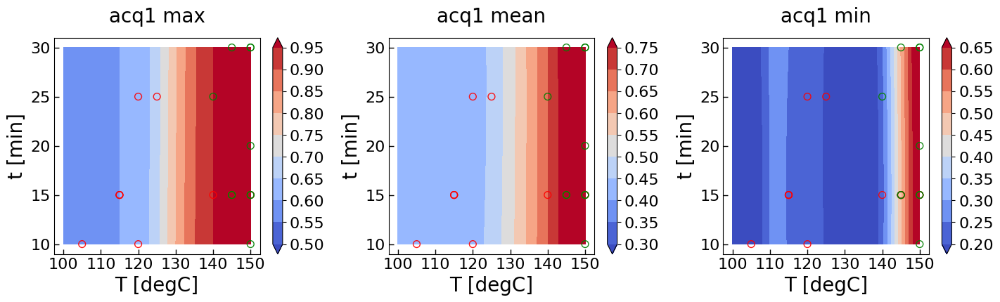

In [66]:
design = RandomDesign(parameter_space)
x_sampled = design.get_samples(200)
x_sampled = x_sampled
input_dim = 6
for i in range(input_dim):
    for j in range(input_dim-i-1):
        ind1 = i
        ind2 = j+i+1
        n_steps =21
        x1x2y_pred, x1x2y_uncer =[[],[]]
        for x1 in np.linspace(0, 1, n_steps):
            for x2 in np.linspace(0, 1, n_steps):
                x_temp = np.copy(x_sampled)
                x_temp[:,ind1] = x1
                x_temp[:,ind2] = x2
                y_pred = acquisition1.evaluate(x_temp)
                y2 = y_pred
                x1_org = x_denormalizer(x_temp)[0,ind1]
                x2_org = x_denormalizer(x_temp)[0,ind2]
                x1x2y_pred.append([x1_org, x2_org, np.max(y2), np.mean(y2), np.min(y2)])
        
        x1 = np.array(x1x2y_pred, dtype=object)[:,0].reshape(n_steps, n_steps)
        x2 = np.array(x1x2y_pred, dtype=object)[:,1].reshape(n_steps, n_steps)
            
        y_max2 = np.array(x1x2y_pred, dtype=object)[:,2].reshape(n_steps, n_steps)
        y_mean2 = np.array(x1x2y_pred, dtype=object)[:,3].reshape(n_steps, n_steps)
        y_min2 = np.array(x1x2y_pred, dtype=object)[:,4].reshape(n_steps, n_steps)
   
        fs = 20
        title_pad = 16
        
        fig,axes = plt.subplots(1, 3, figsize=(17, 4), sharey = False, sharex = False)
#         for ax, y in zip(axes,
#                            [y_max2, y_mean2, y_min2]):
#             c_plt1 = ax.contourf(x1, x2, y,cmap='coolwarm',extend='both')
        colorbar_offset = [0.5, 0.3, 0.2]
        for ax, c_offset, y in zip(axes,colorbar_offset,
                           [y_max2, y_mean2, y_min2]):
            c_plt1 = ax.contourf(x1, x2, y/240,levels = np.arange(10)*0.05+c_offset,cmap='coolwarm',extend='both')
#             c_plt1 = ax.contourf(x1, x2, y/max(y_max2.flatten()),levels = np.arange(10)*0.05+c_offset,cmap='coolwarm',extend='both')
            cbar = fig.colorbar(c_plt1, ax= ax)
            cbar.ax.tick_params(labelsize=fs*0.8)
            ax.scatter(x_denormalizer(X2)[:, ind1], 
                       x_denormalizer(X2)[:, ind2], 
                       s = 50, facecolors='none', alpha = 0.9, edgecolor = 'red')
            ax.scatter((X_new)[:, ind1], 
                       (X_new)[:, ind2], 
                       s = 50, facecolors='none', alpha = 0.9, edgecolor = 'green')
            ax.set_xlabel(str(x_labels[ind1]),fontsize =  fs)
            ax.set_ylabel(str(x_labels[ind2]),fontsize =  fs)
            
            x1_delta = (np.max(x1)-np.min(x1))*0.05
            x2_delta = (np.max(x2)-np.min(x2))*0.05
            ax.set_xlim(np.min(x1)-x1_delta, np.max(x1)+x1_delta)
            ax.set_ylim(np.min(x2)-x2_delta, np.max(x2)+x2_delta)
            
            ax.tick_params(direction='in', length=5, width=1, labelsize = fs*.8)#, grid_alpha = 0.5
            if ind1==0:#MACl%
                ax.set_xticks([0, 10, 20, 30])
            if ind1==1:#DMF%
                ax.set_xticks([0, 30, 60, 90])
            if ind1==2:#V
                ax.set_xticks([15, 20, 25, 30])
            if ind1==3:#Q
                ax.set_xticks([0.7, 0.9, 1.1, 1.3, 1.5, 1.7])
            if ind1==4:#T
                ax.set_xticks([100, 110, 120, 130, 140, 150])
            if ind1==5:#t
                ax.set_yticks([10, 15, 20, 25, 30])
                
        axes[0].set_title('acq1 max', pad = title_pad,fontsize =  fs)
        axes[1].set_title('acq1 mean', pad = title_pad,fontsize =  fs)
        axes[2].set_title('acq1 min', pad = title_pad,fontsize =  fs)

        plt.subplots_adjust(wspace = 0.3)
        plt.show()

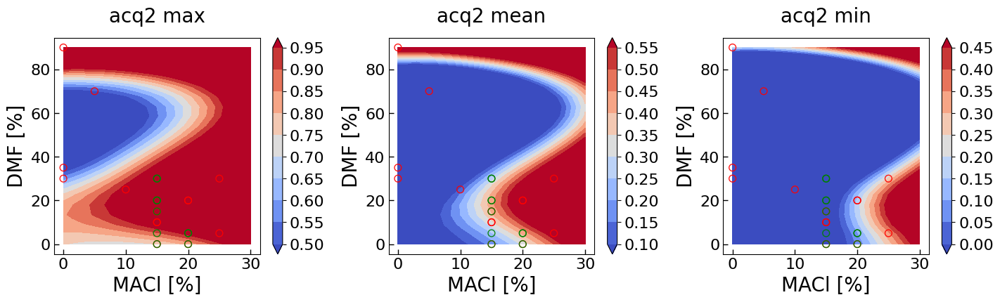

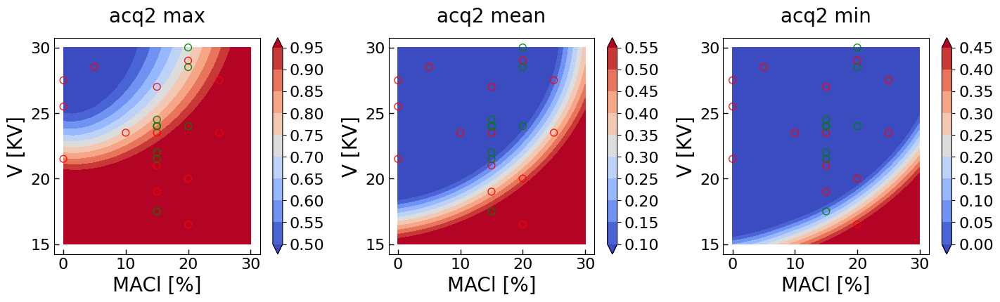

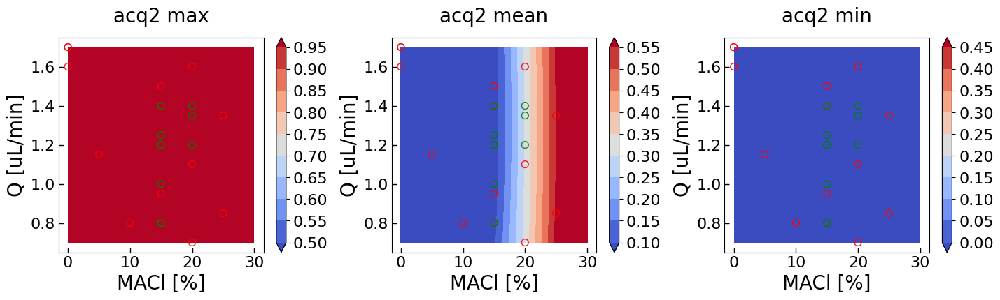

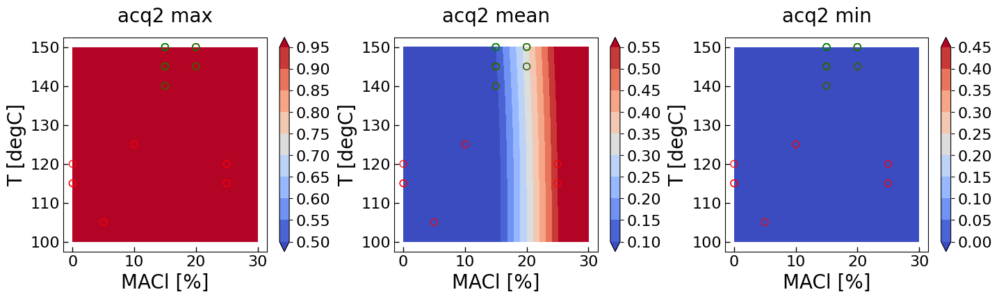

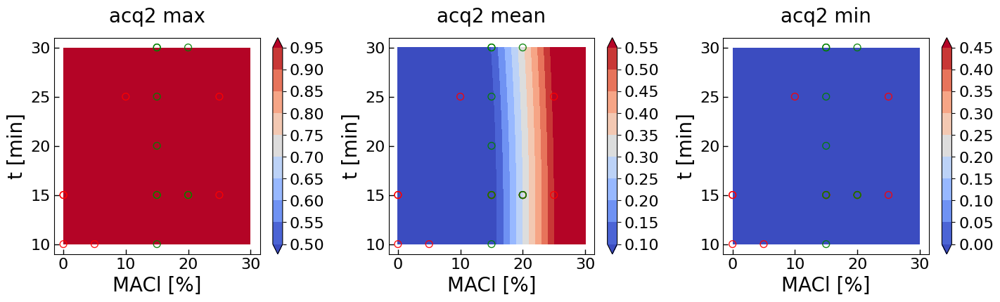

...

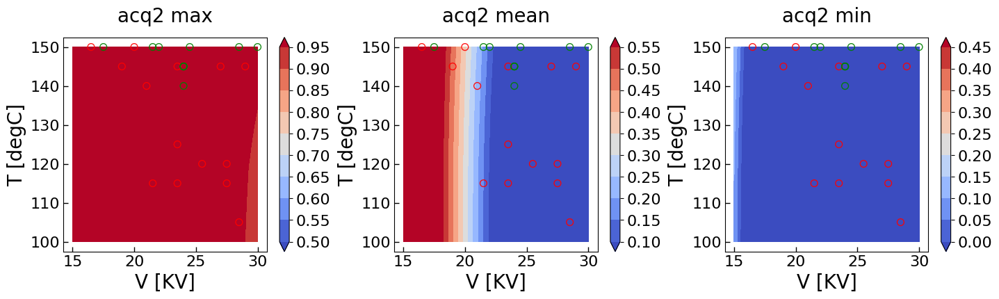

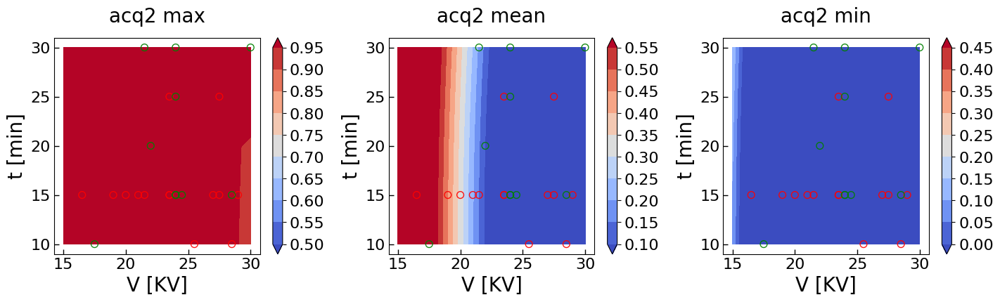

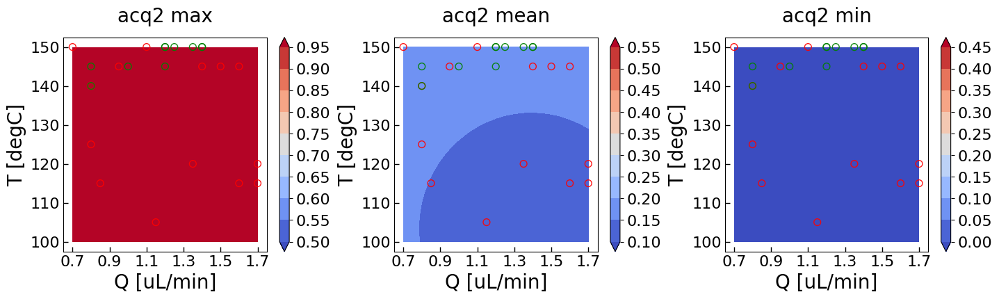

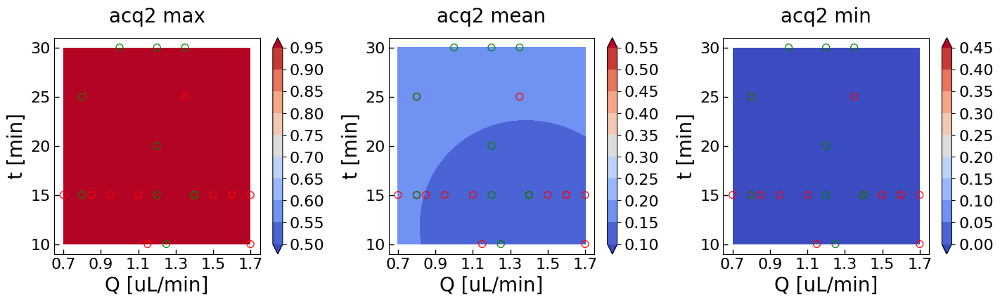

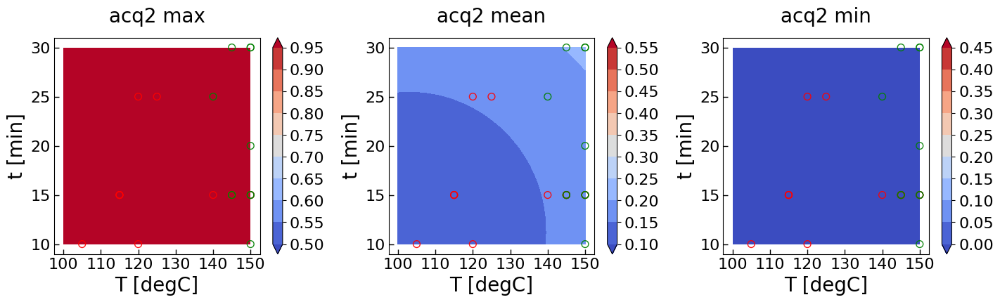

In [70]:
design = RandomDesign(parameter_space)
x_sampled = design.get_samples(200)
x_sampled = x_sampled
input_dim = 6
for i in range(input_dim):
    for j in range(input_dim-i-1):
        ind1 = i
        ind2 = j+i+1
        n_steps =21
        x1x2y_pred, x1x2y_uncer =[[],[]]
        for x1 in np.linspace(0, 1, n_steps):
            for x2 in np.linspace(0, 1, n_steps):
                x_temp = np.copy(x_sampled)
                x_temp[:,ind1] = x1
                x_temp[:,ind2] = x2
                y_pred = acquisition2.evaluate(x_temp)
                y2 = y_pred
                x1_org = x_denormalizer(x_temp)[0,ind1]
                x2_org = x_denormalizer(x_temp)[0,ind2]
                x1x2y_pred.append([x1_org, x2_org, np.max(y2), np.mean(y2), np.min(y2)])
        
        x1 = np.array(x1x2y_pred, dtype=object)[:,0].reshape(n_steps, n_steps)
        x2 = np.array(x1x2y_pred, dtype=object)[:,1].reshape(n_steps, n_steps)
            
        y_max2 = np.array(x1x2y_pred, dtype=object)[:,2].reshape(n_steps, n_steps)
        y_mean2 = np.array(x1x2y_pred, dtype=object)[:,3].reshape(n_steps, n_steps)
        y_min2 = np.array(x1x2y_pred, dtype=object)[:,4].reshape(n_steps, n_steps)
   
        fs = 20
        title_pad = 16
        
        fig,axes = plt.subplots(1, 3, figsize=(17, 4), sharey = False, sharex = False)
#         for ax, y in zip(axes,
#                            [y_max2, y_mean2, y_min2]):
#             c_plt1 = ax.contourf(x1, x2, (y+1.5)/1.5,cmap='coolwarm',extend='both')
        colorbar_offset = [0.5, 0.1, 0]
        for ax, c_offset, y in zip(axes,colorbar_offset,
                           [y_max2, y_mean2, y_min2]):
#             c_plt1 = ax.contourf(x1, x2, y/max(y_max2.flatten()),levels =np.arange(10)*0.05+c_offset,cmap='coolwarm',extend='both')
            c_plt1 = ax.contourf(x1, x2, (y+2)/2,levels =np.arange(10)*0.05+c_offset,cmap='coolwarm',extend='both')
            cbar = fig.colorbar(c_plt1, ax= ax)
            cbar.ax.tick_params(labelsize=fs*0.8)
            ax.scatter(x_denormalizer(X2)[:, ind1], 
                       x_denormalizer(X2)[:, ind2], 
                       s = 50, facecolors='none', alpha = 0.9, edgecolor = 'red')
            ax.scatter((X_new)[:, ind1], 
                       (X_new)[:, ind2], 
                       s = 50, facecolors='none', alpha = 0.9, edgecolor = 'green')
            ax.set_xlabel(str(x_labels[ind1]),fontsize =  fs)
            ax.set_ylabel(str(x_labels[ind2]),fontsize =  fs)
            
            x1_delta = (np.max(x1)-np.min(x1))*0.05
            x2_delta = (np.max(x2)-np.min(x2))*0.05
            ax.set_xlim(np.min(x1)-x1_delta, np.max(x1)+x1_delta)
            ax.set_ylim(np.min(x2)-x2_delta, np.max(x2)+x2_delta)
            
            ax.tick_params(direction='in', length=5, width=1, labelsize = fs*.8)#, grid_alpha = 0.5
            if ind1==0:#MACl%
                ax.set_xticks([0, 10, 20, 30])
            if ind1==1:#DMF%
                ax.set_xticks([0, 30, 60, 90])
            if ind1==2:#V
                ax.set_xticks([15, 20, 25, 30])
            if ind1==3:#Q
                ax.set_xticks([0.7, 0.9, 1.1, 1.3, 1.5, 1.7])
            if ind1==4:#T
                ax.set_xticks([100, 110, 120, 130, 140, 150])
            if ind1==5:#t
                ax.set_yticks([10, 15, 20, 25, 30])
                
        axes[0].set_title('acq2 max', pad = title_pad,fontsize =  fs)
        axes[1].set_title('acq2 mean', pad = title_pad,fontsize =  fs)
        axes[2].set_title('acq2 min', pad = title_pad,fontsize =  fs)

        plt.subplots_adjust(wspace = 0.3)
        plt.show()

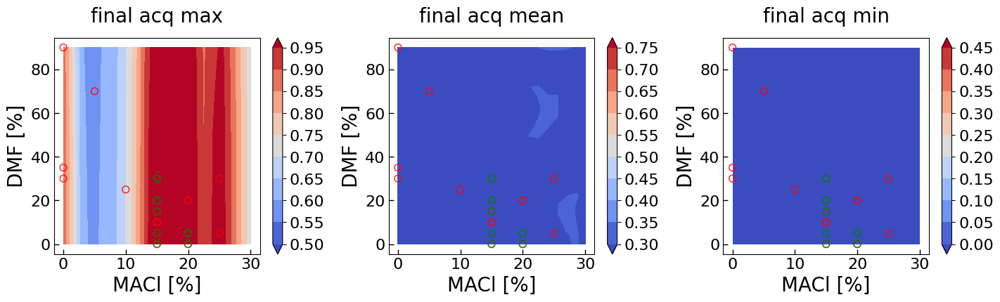

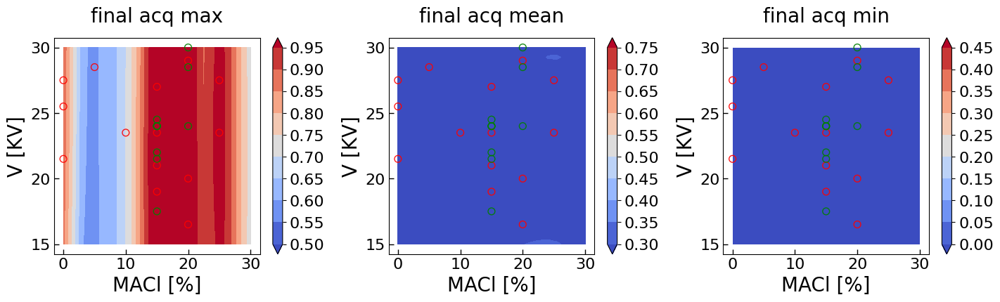

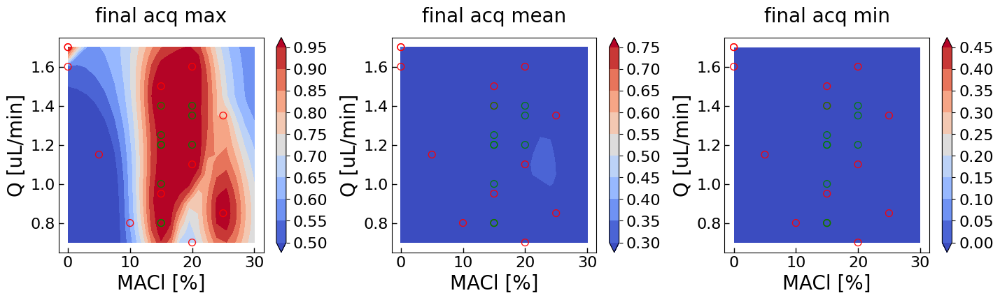

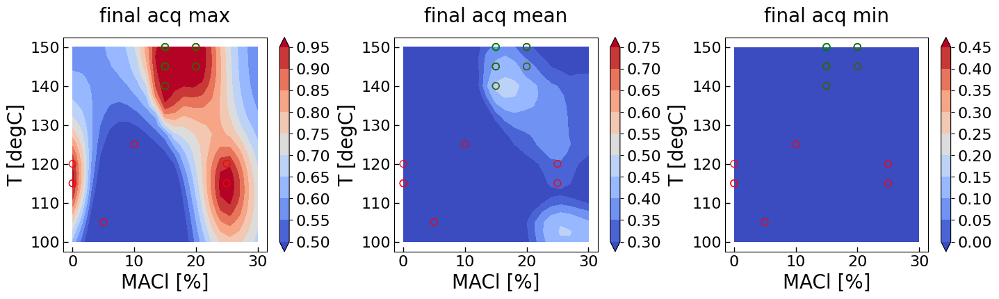

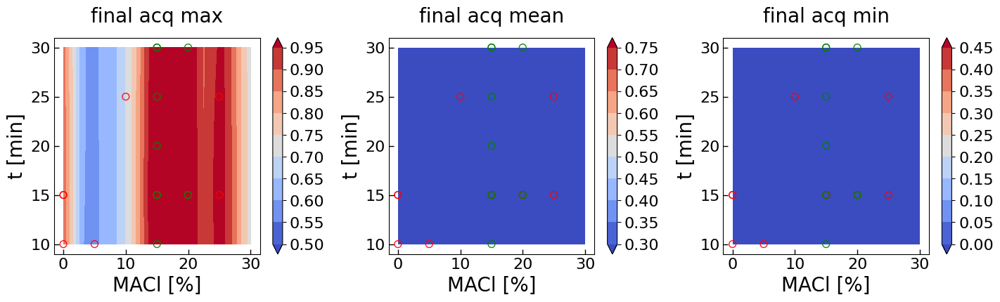

...

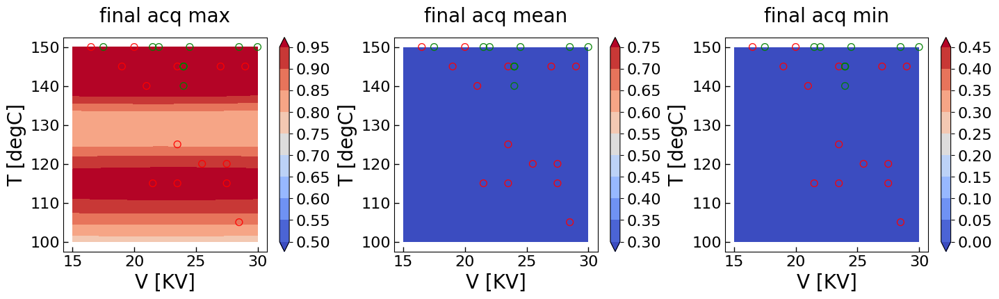

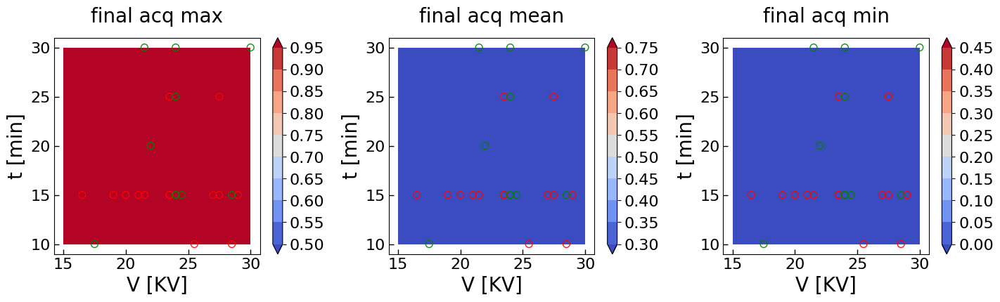

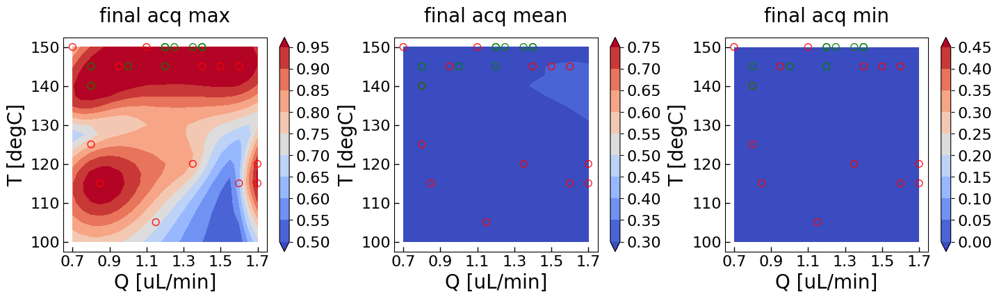

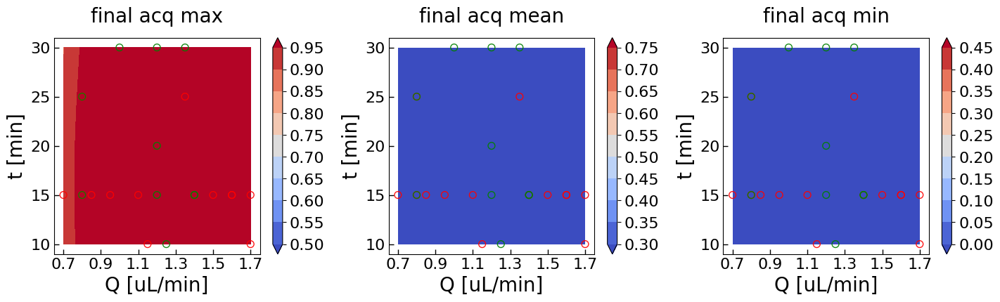

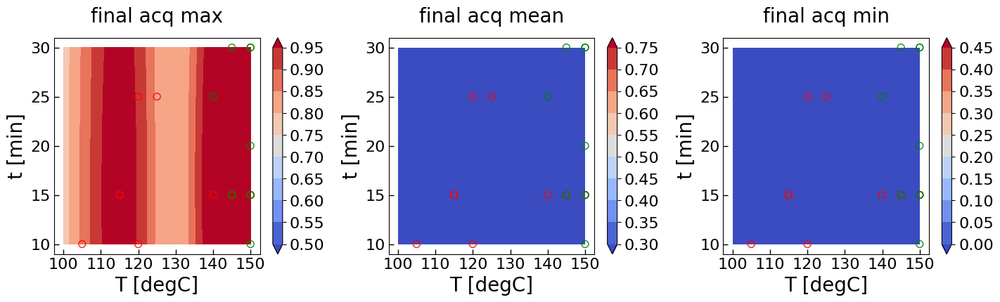

In [68]:
design = RandomDesign(parameter_space)
x_sampled = design.get_samples(200)
x_sampled = x_sampled
input_dim = 6
for i in range(input_dim):
    for j in range(input_dim-i-1):
        ind1 = i
        ind2 = j+i+1
        n_steps =21
        x1x2y_pred, x1x2y_uncer =[[],[]]
        for x1 in np.linspace(0, 1, n_steps):
            for x2 in np.linspace(0, 1, n_steps):
                x_temp = np.copy(x_sampled)
                x_temp[:,ind1] = x1
                x_temp[:,ind2] = x2
                y_pred1 = -acquisition1.evaluate(x_temp)
                y_pred2 = -acquisition2.evaluate(x_temp)
                cons = acquisition_constraint.evaluate(x_temp)
                x1_org = x_denormalizer(x_temp)[0,ind1]
                x2_org = x_denormalizer(x_temp)[0,ind2]
                tolerances = np.array([-105,2]) 
                absolutes = [True, True]
                goals = ['min', 'min'] 
                chimera = Chimera(tolerances=tolerances, absolutes=absolutes, goals=goals)
                raw_acq = np.array([y_pred1.T[0], y_pred2.T[0]])
                scalarized = chimera.scalarize(raw_acq.T)
                y=1-scalarized
                x1x2y_pred.append([x1_org, x2_org, np.max(y), np.mean(y), np.min(y),
                                  np.max(cons), np.mean(cons), np.min(cons)])
        
        x1 = np.array(x1x2y_pred, dtype=object)[:,0].reshape(n_steps, n_steps)
        x2 = np.array(x1x2y_pred, dtype=object)[:,1].reshape(n_steps, n_steps)
        y_max1 = np.array(x1x2y_pred, dtype=object)[:,2]
        y_mean1 = np.array(x1x2y_pred, dtype=object)[:,3]
        y_min1 = np.array(x1x2y_pred, dtype=object)[:,4]
        cons_max = np.array(x1x2y_pred, dtype=object)[:,5]
        cons_mean = np.array(x1x2y_pred, dtype=object)[:,6]
        cons_min = np.array(x1x2y_pred, dtype=object)[:,7]   
        
        cons_acq_max =  ((y_max1)*cons_max).reshape(n_steps, n_steps)
        cons_acq_mean = ((y_mean1)*cons_mean).reshape(n_steps, n_steps)
        cons_acq_min = ((y_min1)*cons_min).reshape(n_steps, n_steps)
        
        fs = 20
        title_pad = 16
        
        fig,axes = plt.subplots(1, 3, figsize=(17, 4), sharey = False, sharex = False)
#         for ax, y in zip(axes,
#                            [y_max2, y_mean2, y_min2]):
#             c_plt1 = ax.contourf(x1, x2, y,cmap='coolwarm',extend='both')
        colorbar_offset = [0.5, 0.3, 0]
        for ax, c_offset, y in zip(axes,colorbar_offset,
                           [cons_acq_max, cons_acq_mean, cons_acq_min]):
            c_plt1 = ax.contourf(x1, x2, y,levels = np.arange(10)*0.05+c_offset,cmap='coolwarm',extend='both')
            cbar = fig.colorbar(c_plt1, ax= ax)
            cbar.ax.tick_params(labelsize=fs*0.8)
            ax.scatter(x_denormalizer(X2)[:, ind1], 
                       x_denormalizer(X2)[:, ind2], 
                       s = 50, facecolors='none', alpha = 0.9, edgecolor = 'red')
            ax.scatter((X_new)[:, ind1], 
                       (X_new)[:, ind2], 
                       s = 50, facecolors='none', alpha = 0.9, edgecolor = 'green')
            ax.set_xlabel(str(x_labels[ind1]),fontsize =  fs)
            ax.set_ylabel(str(x_labels[ind2]),fontsize =  fs)
            
            x1_delta = (np.max(x1)-np.min(x1))*0.05
            x2_delta = (np.max(x2)-np.min(x2))*0.05
            ax.set_xlim(np.min(x1)-x1_delta, np.max(x1)+x1_delta)
            ax.set_ylim(np.min(x2)-x2_delta, np.max(x2)+x2_delta)
            
            ax.tick_params(direction='in', length=5, width=1, labelsize = fs*.8)#, grid_alpha = 0.5
            if ind1==0:#MACl%
                ax.set_xticks([0, 10, 20, 30])
            if ind1==1:#DMF%
                ax.set_xticks([0, 30, 60, 90])
            if ind1==2:#V
                ax.set_xticks([15, 20, 25, 30])
            if ind1==3:#Q
                ax.set_xticks([0.7, 0.9, 1.1, 1.3, 1.5, 1.7])
            if ind1==4:#T
                ax.set_xticks([100, 110, 120, 130, 140, 150])
            if ind1==5:#t
                ax.set_yticks([10, 15, 20, 25, 30])
                
        axes[0].set_title('final acq max', pad = title_pad,fontsize =  fs)
        axes[1].set_title('final acq mean', pad = title_pad,fontsize =  fs)
        axes[2].set_title('final acq min', pad = title_pad,fontsize =  fs)

        plt.subplots_adjust(wspace = 0.3)
        plt.show()